<a href="https://colab.research.google.com/github/piyushsrivastav/Customer-acquisition/blob/main/Customer%20Acquisiton%20with%20other%20approach.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center><h1 style="color: #ff6600">Capstone Project (Cost Prediction on Acquiring Customers) </h1></center>

<h3><font color=blue>PROJECT OBJECTIVE:</font></h3>

##### To predict the cost of media campaigns in food mart of USA based on reference data which includes customer’s details, product details, promotion details, and store details.

<h4 style="color: #66ccff">DATA DESCRIPTION</h4>

##### Food mart X is a chain of convenience stores in the United States. The private company’s headquarters are in Mentor, Ohio, and currently, approximately 325 stores are in the US. Convenient food mart operates on the franchise system.
- Cost: cost of acquiring customers in dollars (target).
- Customer details: marital status, gender, no. of children, education, occupation, and member card type. etc.
- Product details: brand name, SRP/MRP of the product, gross weight, net weight, and whether the food item has a recyclable package or not etc.
- Store details: store sales, cost, store type, city, state, grocery, frozen food, and meat area available in sqft. etc.
- Promotion details: name of the promotion done on the media


In [ ]:
from sklearn import  metrics

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

#from sklearn.datasets import make_regression


from scipy.stats import chi2_contingency
#from mlxtend.feature_selection import SequentialFeatureSelector as sfs
#from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

from sklearn import  metrics
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression,Lasso,Ridge,ElasticNet,RidgeCV
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV,RandomizedSearchCV
from sklearn.feature_selection import f_regression,SelectFromModel,SequentialFeatureSelector,SelectKBest

from sklearn.neighbors import KNeighborsClassifier
from sklearn import neighbors
#import xgboost as xg
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error,mean_absolute_percentage_error

In [ ]:
# If using Google Colab
# from google.colab import drive
# drive.mount('/content/drive')
# df = pd.read_csv('/content/drive/MyDrive/Colab_Notebooks/Train.csv')
# df.head()

In [ ]:
df = pd.read_csv('Train.csv')
df.head(n=5).transpose()

,0,1,2,3,4
row_id,1,2,3,4,5
food_category,Bathroom Products,Fruit,Beer and Wine,Fruit,Paper Products
food_department,Health and Hygiene,Produce,Alcoholic Beverages,Canned Products,Household
food_family,Non-Consumable,Food,Drink,Food,Non-Consumable
store_sales(in millions),4.35,5.58,5.1,4.2,10.35
store_cost(in millions),1.3485,1.8414,2.142,2.058,3.519
unit_sales(in millions),3,3,3,3,3
promotion_name,Double Down Sale,Shelf Clearing Days,Two Day Sale,Cash Register Lottery,One Day Sale
sales_country,Canada,USA,Mexico,USA,Mexico
marital_status,M,S,S,S,S


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36256 entries, 0 to 36255
Data columns (total 41 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   row_id                      36256 non-null  int64  
 1   food_category               36256 non-null  object 
 2   food_department             36256 non-null  object 
 3   food_family                 36256 non-null  object 
 4   store_sales(in millions)    36256 non-null  float64
 5   store_cost(in millions)     36256 non-null  float64
 6   unit_sales(in millions)     36256 non-null  int64  
 7   promotion_name              36256 non-null  object 
 8   sales_country               36256 non-null  object 
 9   marital_status              36256 non-null  object 
 10  gender                      36256 non-null  object 
 11  total_children              36256 non-null  int64  
 12  education                   36256 non-null  object 
 13  member_card                 362

<h4 style="color: #66ccff">Checking the size of Test Data</h4>

In [ ]:
df1 = pd.read_csv('Test.csv')

In [ ]:
df.shape

(36256, 41)

In [ ]:
df1.shape

(12086, 41)

<h2><font color=blue> Data cleansing</font></h2>

In [ ]:
def checkParcentMissingValues(df):
    Missing_Values = (df.isnull() | df.isna()).sum().any()
    if(Missing_Values == False):
        print("Given DataFrame has no Missing Value")
    elif(Missing_Values == True):
        missing_col = df.columns[df.isnull().mean()!=0]
        percentage_miss_val = df[missing_col].isnull().sum()/len(df)*100
        print('Display which column has null values and its dtype: \033[1m', missing_col,'\033[0m')  
        print('\033[0mNo.Of Null/Missing rows:\033[1m' , df[missing_col].isnull().sum().sum())
    return

checkParcentMissingValues(df) 

Given DataFrame has no Missing Value


In [ ]:
def checkDuplicateValues(df):
    Duplicate_Values = df.duplicated().sum().any()
    if Duplicate_Values == True:
        print("shape of the dataframe before removing duplicated", df.shape)
        print("No.of Duplicate records in the DataFrame:",df.duplicated().sum())
        df.drop_duplicates(keep='first', inplace=True)
        print("All the Duplicate records are removed and only original values have been retained in the DataFrame.") 
        print("shape of the dataframe after removing duplicated", df.shape)    
    elif Duplicate_Values == False:
        print("Given DataFrame has no Duplicate Records")
    return

checkDuplicateValues(df)

Given DataFrame has no Duplicate Records


<h4 style="color: #66ccff"> Checking summary statistics of the dataset, and writing key observations.</h4>

In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
row_id,36256.0,18128.500000,10466.350016,1.0000,9064.75,18128.5000,27192.2500,36256.0000
store_sales(in millions),36256.0,6.549142,3.466700,0.5200,3.80,5.9400,8.6700,22.9200
store_cost(in millions),36256.0,2.620838,1.453903,0.1792,1.50,2.3856,3.4854,9.7265
unit_sales(in millions),36256.0,3.093143,0.828942,1.0000,3.00,3.0000,4.0000,6.0000
total_children,36256.0,2.545068,1.487449,0.0000,1.00,3.0000,4.0000,5.0000
avg_cars_at home(approx),36256.0,2.197705,1.110560,0.0000,1.00,2.0000,3.0000,4.0000
num_children_at_home,36256.0,0.836496,1.308415,0.0000,0.00,0.0000,1.0000,5.0000
avg_cars_at home(approx).1,36256.0,2.197705,1.110560,0.0000,1.00,2.0000,3.0000,4.0000
SRP,36256.0,2.118466,0.932304,0.5000,1.42,2.1300,2.7900,3.9800
gross_weight,36256.0,13.782083,4.614967,6.0000,9.70,13.6000,17.7000,21.9000


In [ ]:
df.describe(include = "O")

,food_category,food_department,food_family,promotion_name,sales_country,marital_status,gender,education,member_card,occupation,houseowner,avg. yearly_income,brand_name,store_type,store_city,store_state,media_type
count,36256,36256,36256,36256,36256,36256,36256,36256,36256,36256,36256,36256,36256,36256,36256,36256,36256
unique,45,22,3,49,3,2,2,5,4,5,2,8,111,5,19,10,13
top,Vegetables,Produce,Food,Weekend Markdown,USA,S,F,Partial High School,Bronze,Professional,Y,$30K - $50K,Hermanos,Supermarket,Tacoma,WA,"Daily Paper, Radio"
freq,4432,5129,25909,1398,23338,18137,18551,10924,20260,11967,21938,11616,1097,15707,3420,11622,4086


<h2 ><font color=#990000> Observations</font></h2>

### Outliers present in the column
- store_sales(in millions)
- store_cost(in millions)
- Mentioned below 3 columns have negligible amount of ouliers which we can ignore
    - num_children_at_home
    - frozen_sqft
    - meat_sqft
    - unit_sales(in millions)

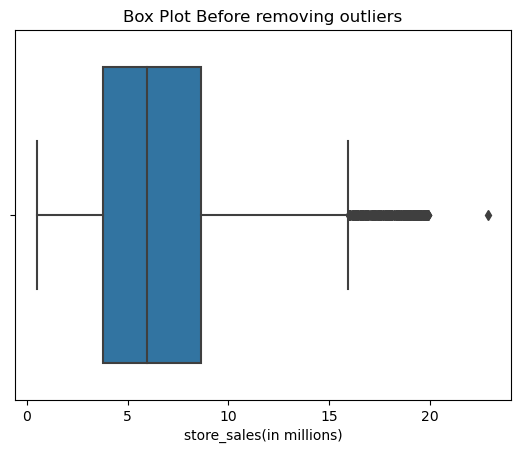


checking the skewness before transformation 0.6866210468760011

Using irq approach for handling outliers.



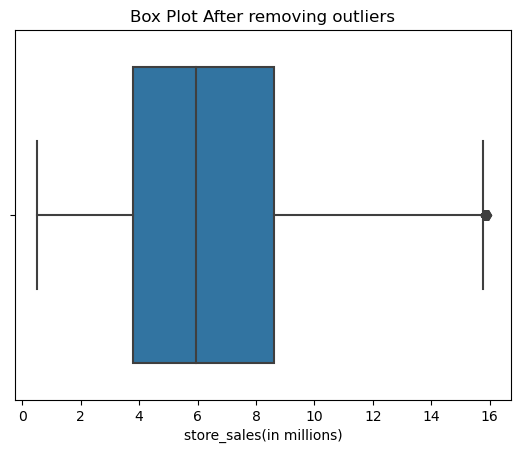


checking the skewness after transformation 0.5826441141374837


In [ ]:
def outliers_handling(df, col_name):
    if (str(df[col_name].dtypes) == 'object'):
        df[col_name] = df[col_name].astype(int)
    
    sns.boxplot(x=df[col_name])
    plt.title("Box Plot Before removing outliers")
    plt.show()
    print("\nchecking the skewness before transformation",df[[col_name]].skew().values[0])
    
    print("\nUsing irq approach for handling outliers.\n")
    q1= df[col_name].quantile(0.25)
    q3= df[col_name].quantile(0.75)
    iqr= q3-q1
    Lower_tail=q1-1.5*iqr
    Upper_tail=q3+1.5*iqr
    for i in range(0,len(df[col_name])):
        if df[col_name][i] > Upper_tail or df[col_name][i] < Lower_tail:
            df[col_name] = df[col_name].replace(df[col_name][i],np.median(df[col_name]))
    
    
    sns.boxplot(x=df[col_name])
    plt.title("Box Plot After removing outliers")
    plt.show()
    print("\nchecking the skewness after transformation",df[[col_name]].skew().values[0])

    return
outliers_handling(df,'store_sales(in millions)')

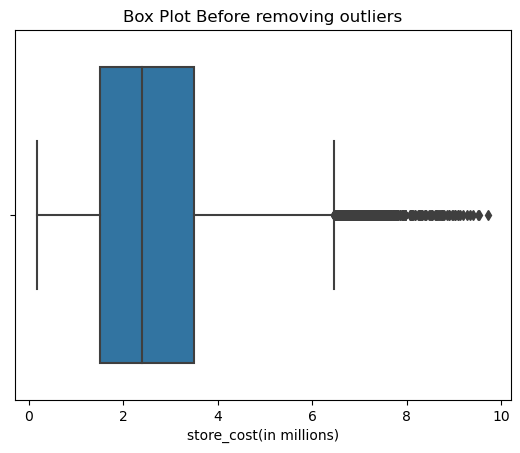


checking the skewness before transformation 0.8444614677746828

Using irq approach for handling outliers.



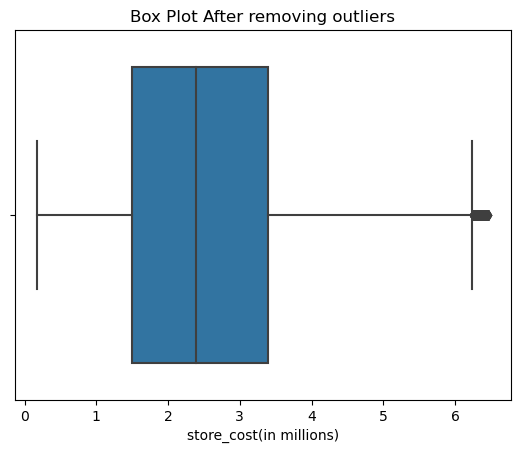


checking the skewness after transformation 0.588156718896177


In [ ]:
outliers_handling(df,'store_cost(in millions)')

<h1 style="color:blue"><center> EDA</center></h1>

<h2 style="color: #66ccff">Univariate Analysis :</h2>

<h4><font color=#FF0000>Univariate analysis for Categorical features:-</font></h4>

In [ ]:
categorical_features = df.select_dtypes(include=[np.object])
print('Catagorial Column names: \n',list(categorical_features.columns), "\n\nNo.of Columns: ", len(categorical_features.columns))

Catagorial Column names: 
 ['food_category', 'food_department', 'food_family', 'promotion_name', 'sales_country', 'marital_status', 'gender', 'education', 'member_card', 'occupation', 'houseowner', 'avg. yearly_income', 'brand_name', 'store_type', 'store_city', 'store_state', 'media_type'] 

No.of Columns:  17


<h3 style="color: #66ccff"> Count plot</h3>

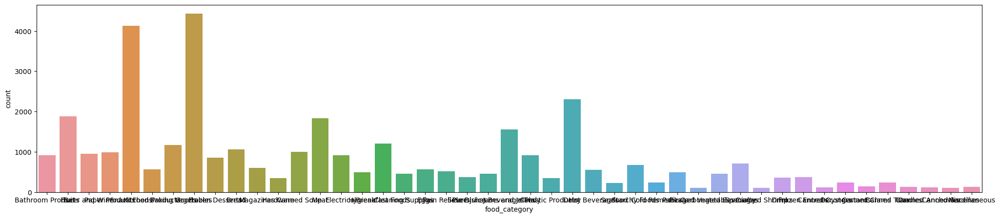

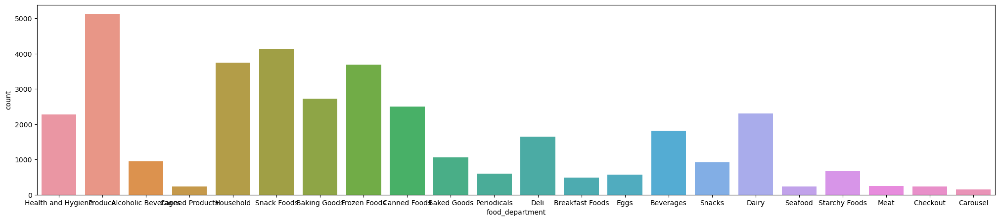

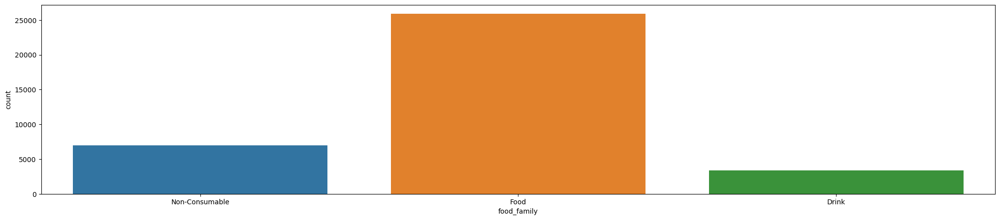

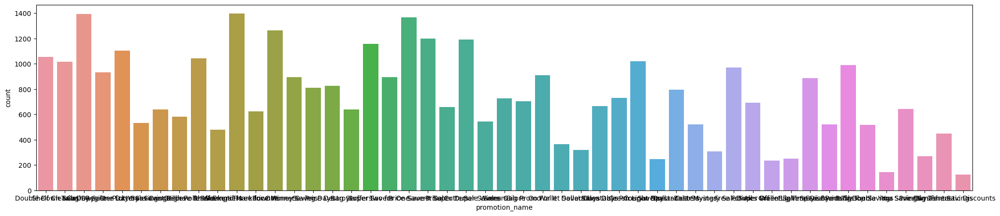

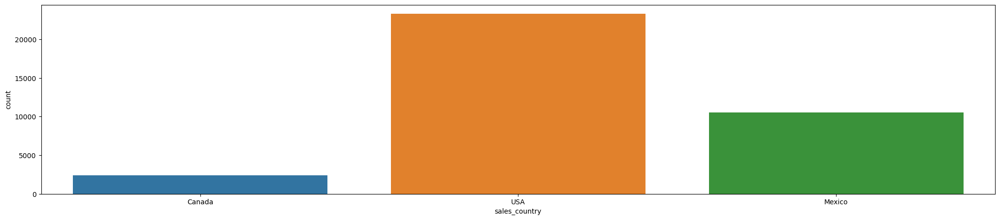

...

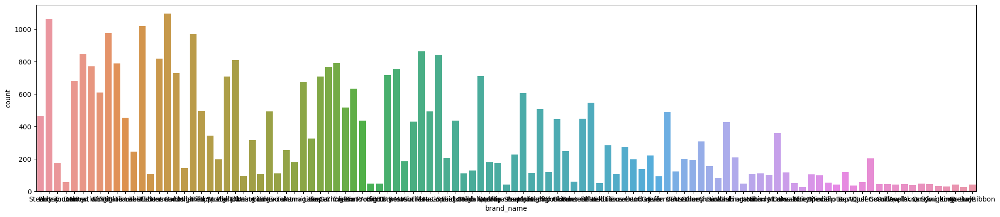

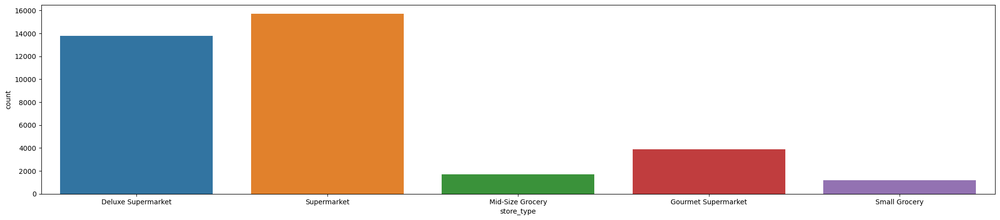

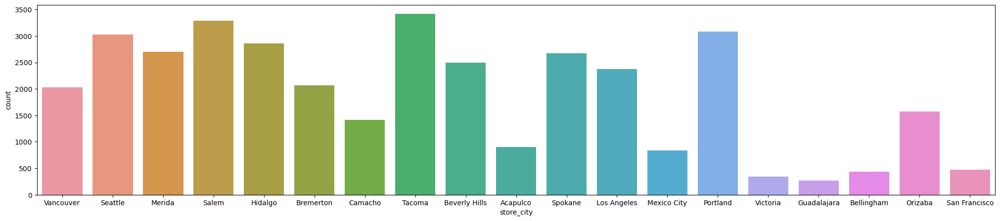

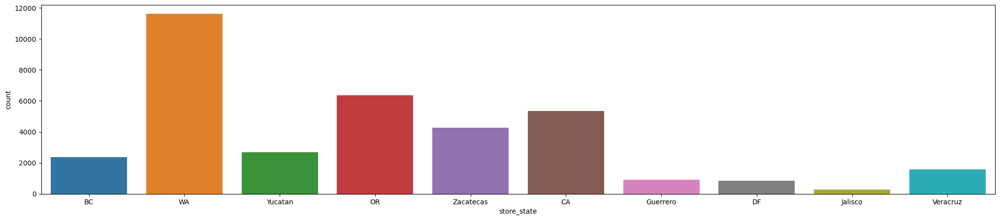

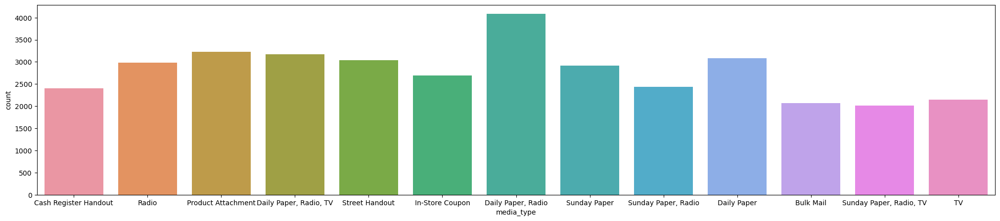

In [ ]:
i = 1
for feature in categorical_features:
        plt.figure(figsize = (25,5))
        sns.countplot(x = feature, data = df)
        i +=1
        plt.show()

<h3 style="color: #66ccff"> Pie chart</h3>

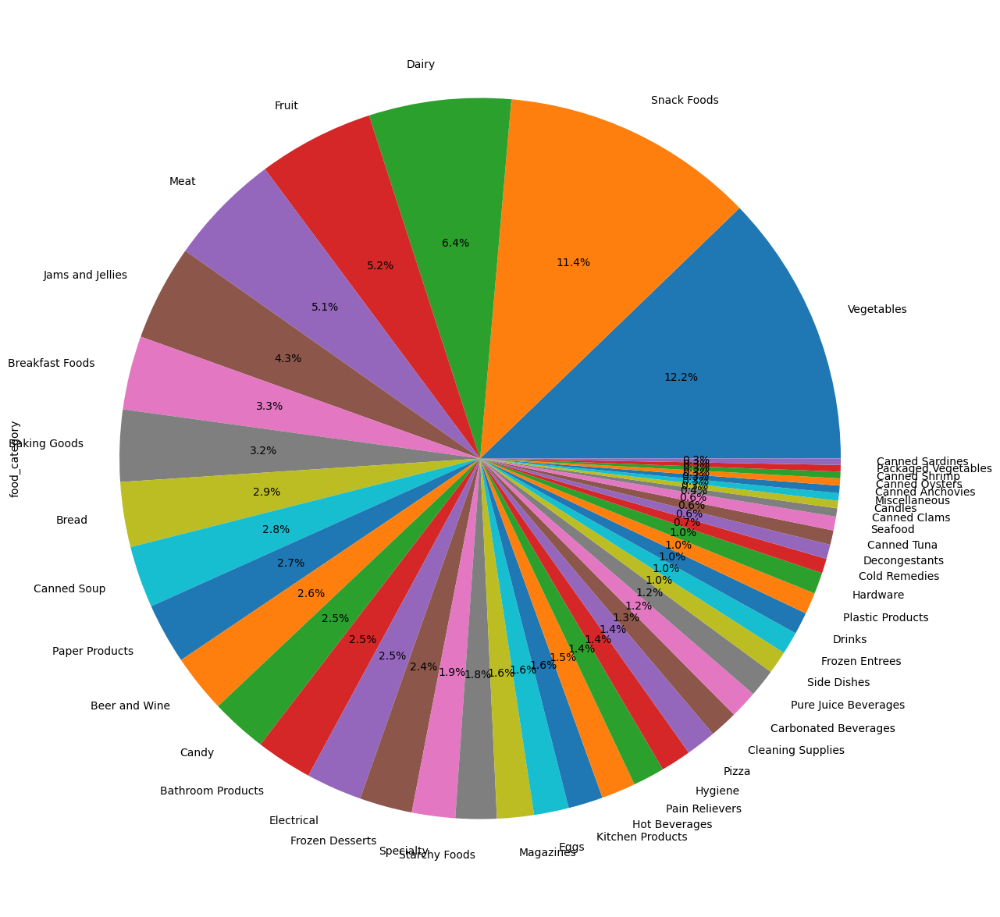

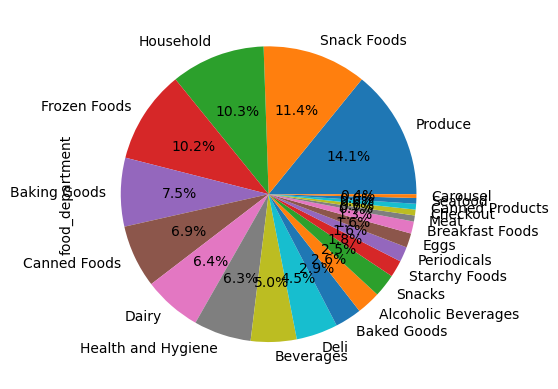

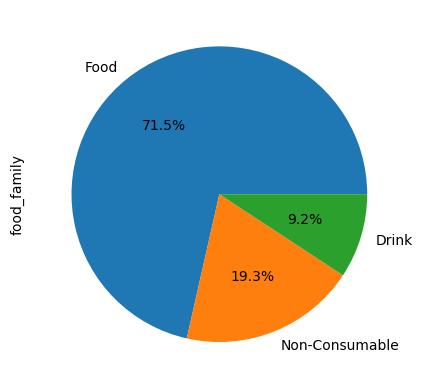

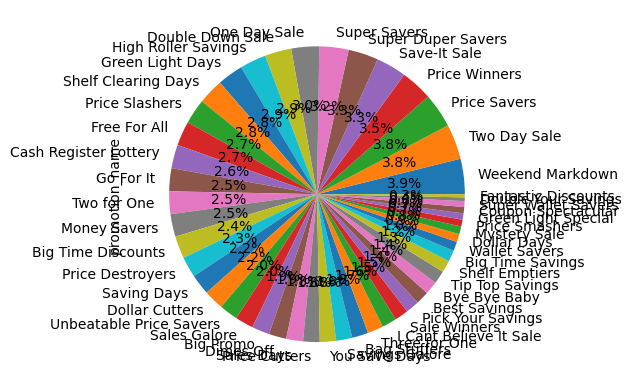

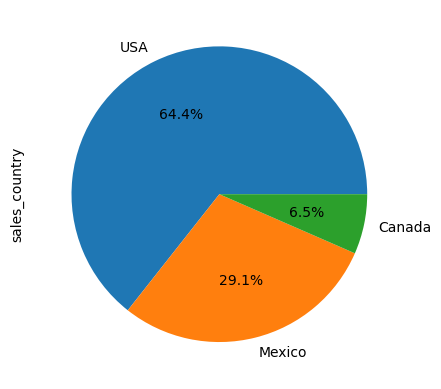

...

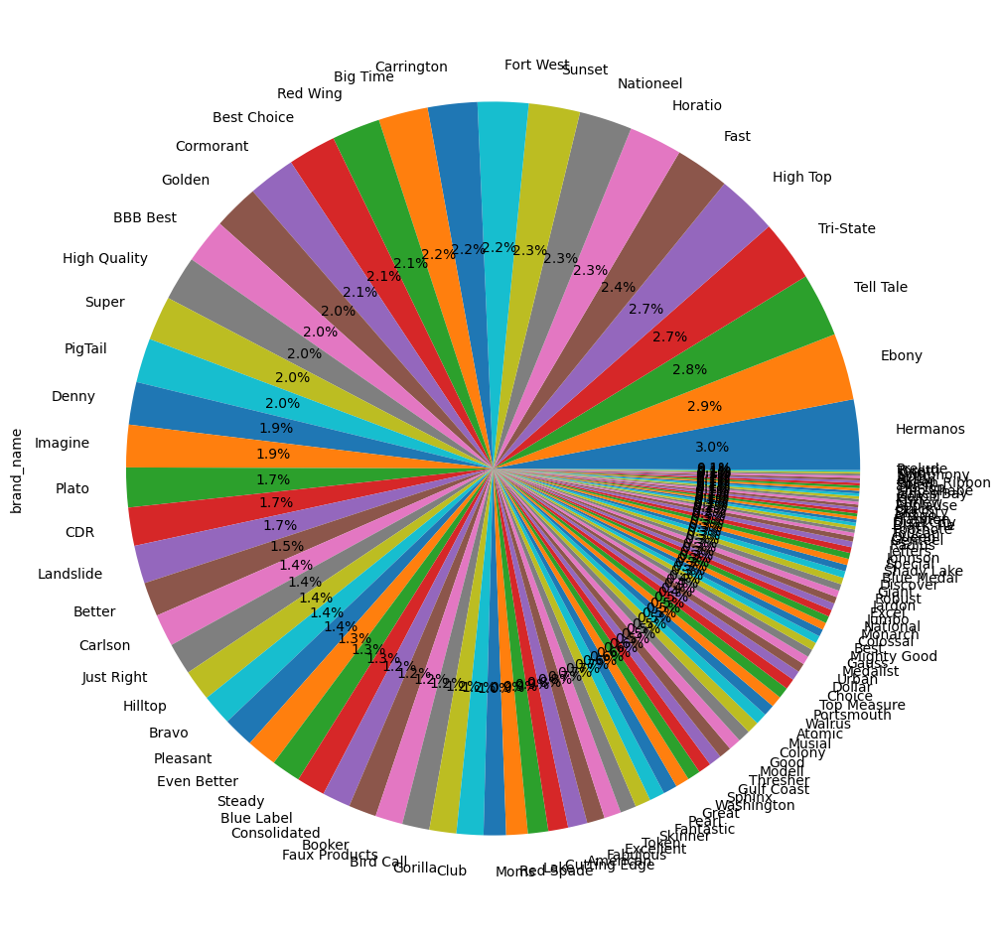

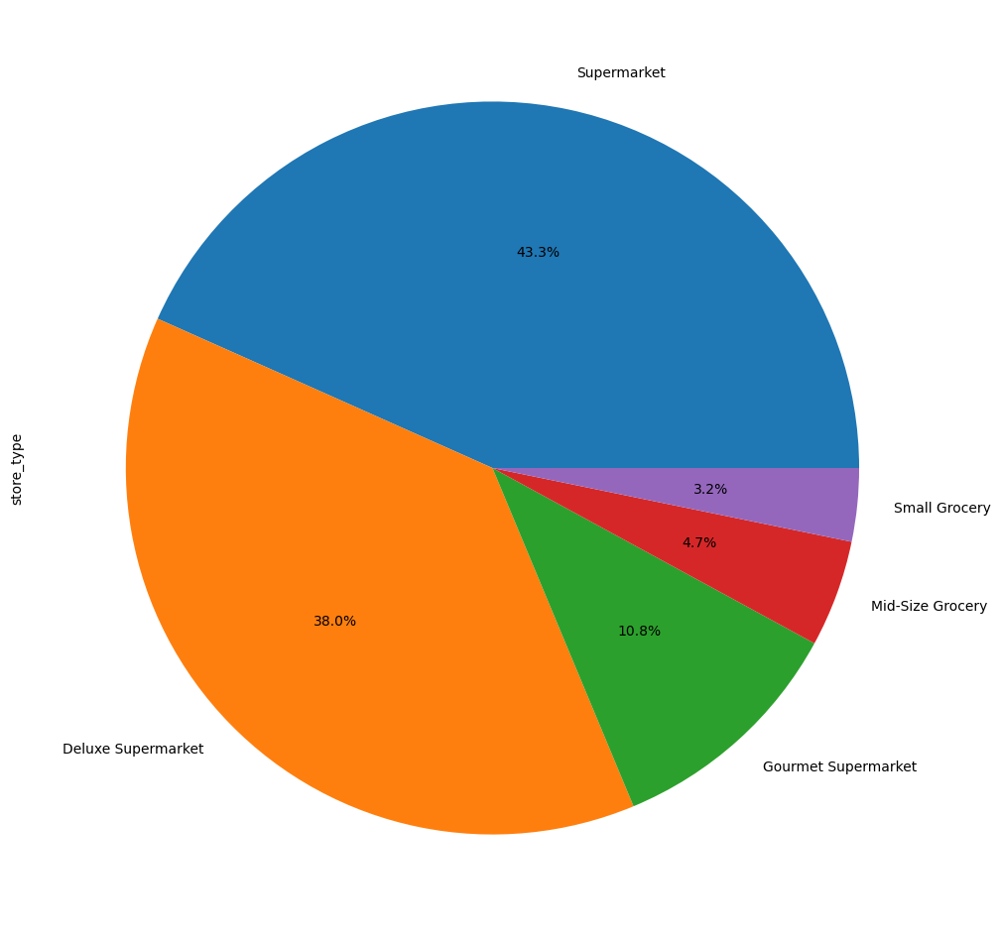

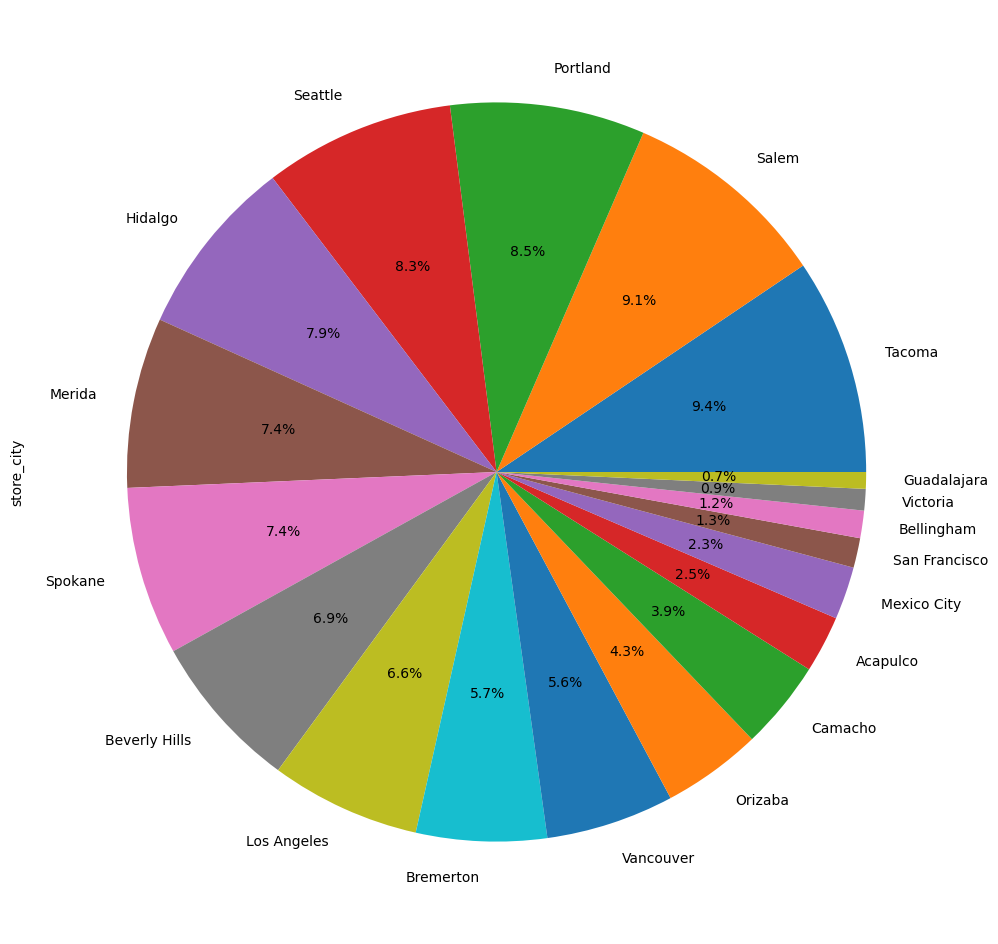

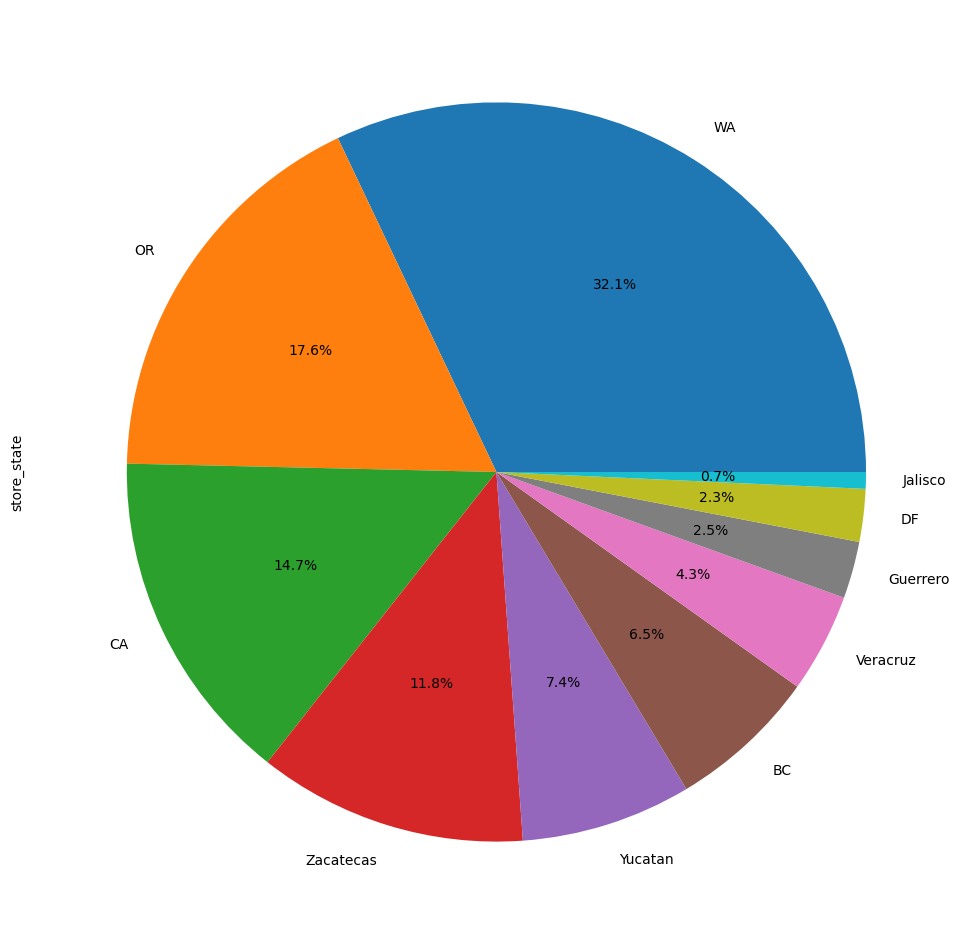

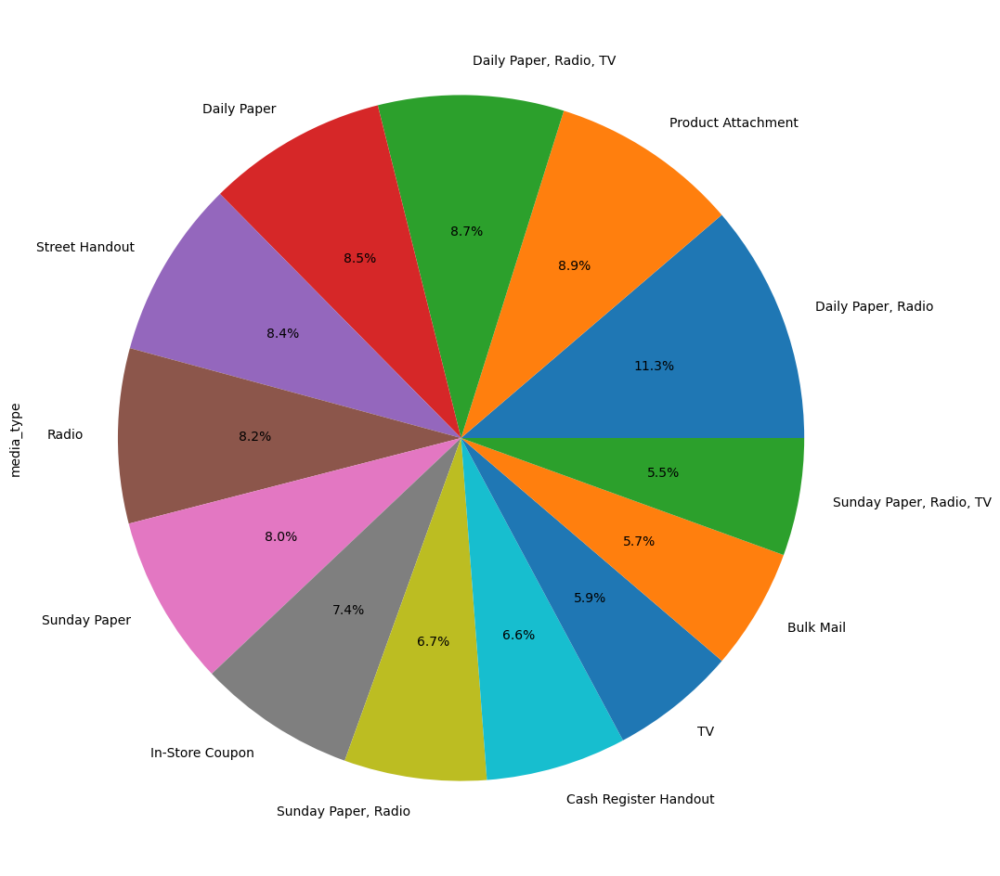

In [ ]:
i = 1
plt.figure(figsize = (45,15))
for feature in categorical_features:
        if(i>10):
            plt.figure(figsize = (40,12))
        df[feature].value_counts().plot(kind='pie', autopct="%.1f%%")
        i +=1
        plt.show()

<h2><font color=#990000> Observations</font></h2>

<h4><font color=#FF0000>Univariate analysis for Continuous features:-</font></h4>

In [ ]:
continuous_features = df.select_dtypes(include=[np.int64,np.float64])
print('continuous Column names: \n',list(continuous_features.columns), "\n\nNo.of Columns: ", len(continuous_features.columns))

continuous Column names: 
 ['row_id', 'store_sales(in millions)', 'store_cost(in millions)', 'unit_sales(in millions)', 'total_children', 'avg_cars_at home(approx)', 'num_children_at_home', 'avg_cars_at home(approx).1', 'SRP', 'gross_weight', 'net_weight', 'recyclable_package', 'low_fat', 'units_per_case', 'store_sqft', 'grocery_sqft', 'frozen_sqft', 'meat_sqft', 'coffee_bar', 'video_store', 'salad_bar', 'prepared_food', 'florist', 'cost'] 

No.of Columns:  24


<h3 style="color: #66ccff"> Hist Plot and box plot </h3>

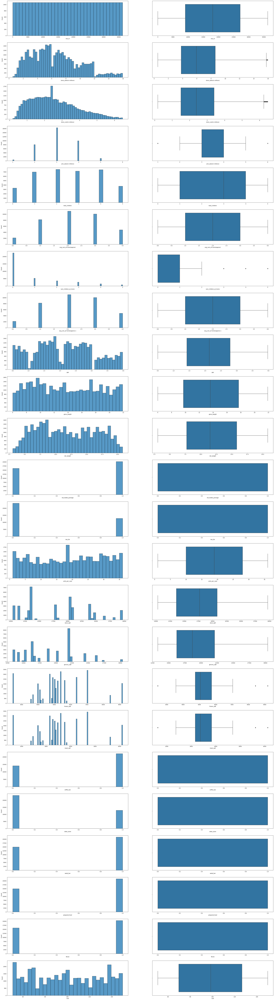

In [ ]:
i = 1
plt.figure(figsize = (40,150))
for feature in continuous_features:
    plt.subplot(24,2,i)
    sns.histplot(data=df, x=df[feature])
    i +=1

    plt.subplot(24,2,i)
    sns.boxplot(data=df, x=df[feature])
    i +=1

<h2><font color=#990000> Observations</font></h2>

<h2><font color=#FF0000> Note</font></h2>

- This dataset consists of more than 48,000 article transactions. All the product are listed individually, like on a receipt. There are 40 columns in total, including informations about the store location, the facilities, the customers informations, and more. So we will start our analysis to get more in-depth findings from the dataset, we will try to do the analysis based on the common/ similar type of features .  


<h2 style="color: #66ccff">1:- Stores Location :</h2>

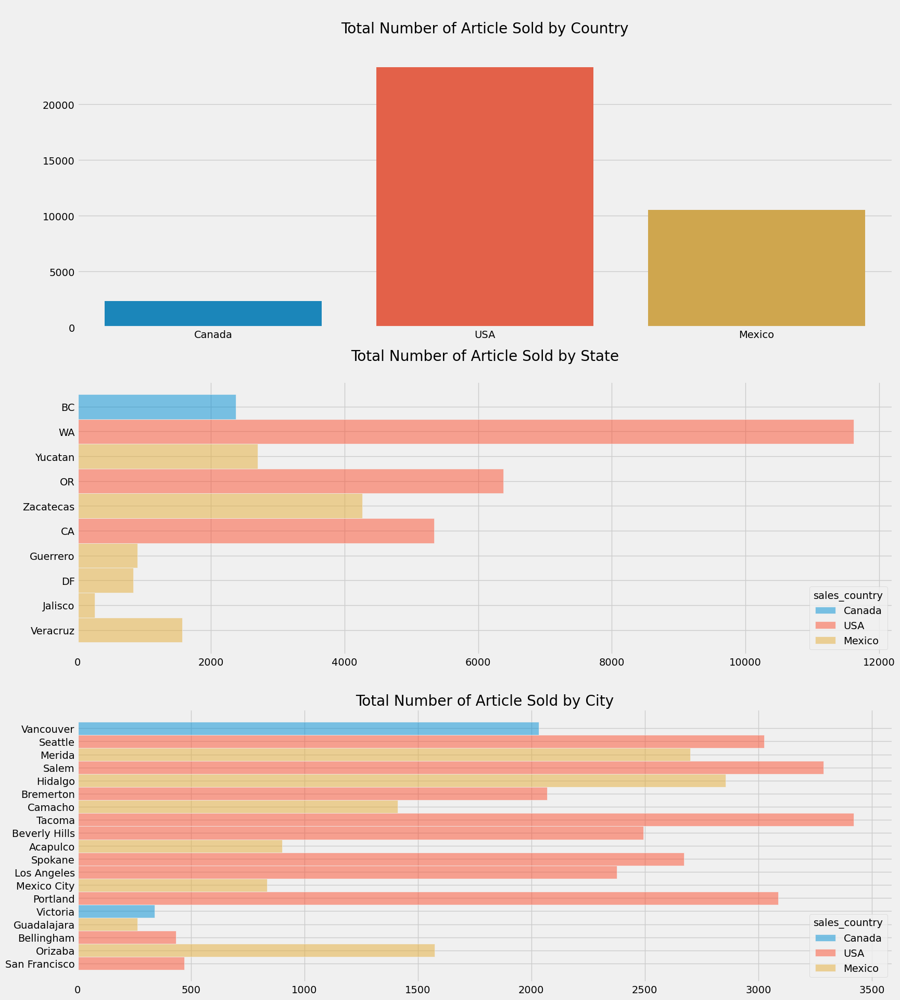

In [ ]:
plt.style.use('fivethirtyeight')
_, ax = plt.subplots(3,1, figsize=(18,22))

sns.countplot(ax=ax[0], data=df, x='sales_country')
ax[0].set_ylabel(None)
ax[0].set_xlabel(None)
ax[0].set_title('\nTotal Number of Article Sold by Country\n')

sns.histplot(ax=ax[1], data=df, y='store_state', hue='sales_country')
ax[1].set_ylabel(None)
ax[1].set_xlabel(None)
ax[1].set_title('\nTotal Number of Article Sold by State\n')

sns.histplot(ax=ax[2], data=df, y='store_city', hue='sales_country')
ax[2].set_ylabel(None)
ax[2].set_xlabel(None)
ax[2].set_title('\nTotal Number of Article Sold by City')

plt.show()

<h2><font color=#990000> Observations based on Store Location </font></h2>

#### The data covers stores in ten states across America:
- 3 are in the United States
- 6 are in Mexico
- 1 in Canada

#### Their are a total of 19 cities in the data:
- 10 in the United States
- 7 in Mexico
- 2 in Canada

<h2 style="color: #66ccff">2:- Customers Demographics :</h2>

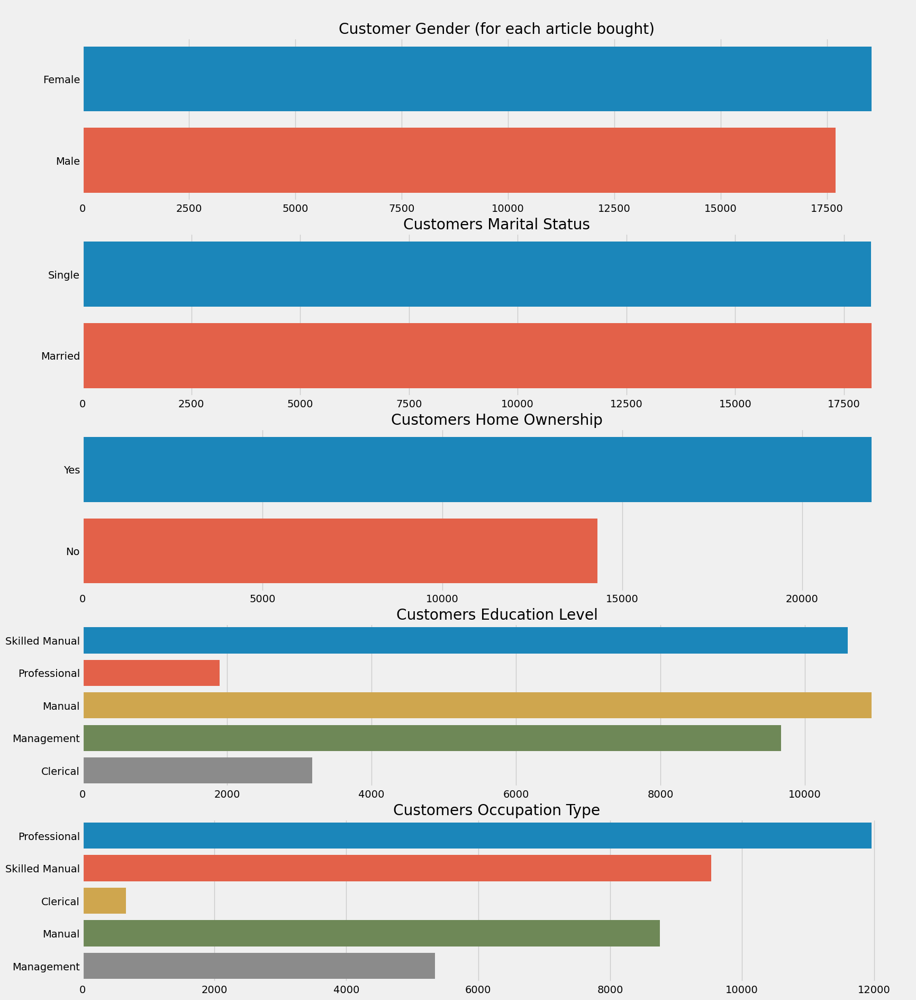

In [ ]:
_, ax = plt.subplots(5,1, figsize=(18,22)) 

sns.countplot(ax=ax[0], data=df, y='gender')
ax[0].set_ylabel(None)
ax[0].set_xlabel(None)
ax[0].set_yticks([1,0])
ax[0].set_yticklabels(labels=['Male', 'Female'])
ax[0].set_title('\nCustomer Gender (for each article bought)')

sns.countplot(ax=ax[1], data=df, y='marital_status')
ax[1].set_ylabel(None)
ax[1].set_xlabel(None)
ax[1].set_yticks([1,0])
ax[1].set_yticklabels(labels=['Married', 'Single'])
ax[1].set_title('\nCustomers Marital Status')

sns.countplot(ax=ax[2], data=df, y='houseowner')
ax[2].set_ylabel(None)
ax[2].set_xlabel(None)
ax[2].set_yticks([1,0])
ax[2].set_yticklabels(labels=['No', 'Yes'])
ax[2].set_title('\nCustomers Home Ownership')

sns.countplot(ax=ax[3],data=df, y='education')
ax[3].set_ylabel(None)
ax[3].set_xlabel(None)
ax[3].set_yticks([0,1,2,3,4])
ax[3].set_yticklabels(labels=['High School*', 'Bachelors','High School','Graduate', 'Bachelors*'])
ax[3].set_title('\nCustomers Education Level')

sns.countplot(ax=ax[4], data=df, y='occupation')
ax[4].set_ylabel(None)
ax[4].set_xlabel(None)
ax[4].set_yticks([0,1,2,3,4])
ax[3].set_yticklabels(labels=['Skilled Manual', 'Professional', 'Manual', 'Management', 'Clerical'])
ax[4].set_title('\nCustomers Occupation Type')

plt.show()

<h2><font color=#990000> Observations based on Customers Demographics </font></h2>

- There's a bit more woman buying their groceries than men, it is sad that there is not more at-home father

- The dataset is evenly splitted between married and single customers. However it is not indicated in which category falls the people who lives together without being married.

- A majority of the customer have high school level, customer starting university without graduating and with a bachelor are the second group. Finally people with a graduate degree are the rarest.

- Manual jobs are the most common, followed by professionnal jobs, and management jobs. Clergy members are representing 1/60 of the transactions.

<h2 style="color: #66ccff">3:- Bought Items :</h2>

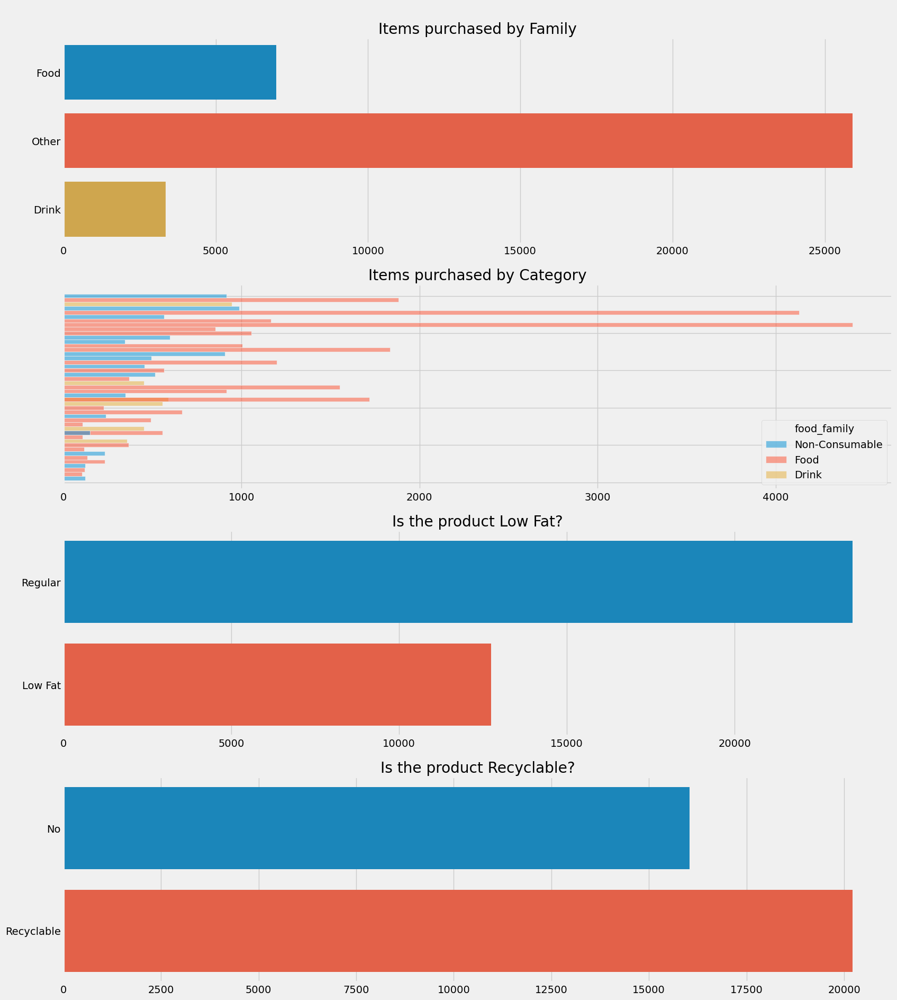

In [ ]:
_, ax = plt.subplots(4,1, figsize=(18,22))

sns.countplot(ax=ax[0], data=df, y='food_family')
ax[0].set_ylabel(None)
ax[0].set_xlabel(None)
ax[0].set_yticks([0,1,2])
ax[0].set_yticklabels(labels=['Food', 'Other', 'Drink'])
ax[0].set_title('\nItems purchased by Family')

sns.histplot(ax=ax[1], data=df, y='food_category', hue='food_family')
ax[1].set_ylabel(None)
ax[1].set_xlabel(None)
ax[1].set_yticks([0,9,18,27,36,45], )
ax[1].set_yticklabels(labels=['','','','','',''])
ax[1].set_title('\nItems purchased by Category')

sns.countplot(ax=ax[2], data=df, y='low_fat')
ax[2].set_ylabel(None)
ax[2].set_xlabel(None)
ax[2].set_yticks([0,1])
ax[2].set_yticklabels(labels=['Regular', 'Low Fat'])
ax[2].set_title('\nIs the product Low Fat?')

sns.countplot(ax=ax[3], data=df, y='recyclable_package')
ax[3].set_ylabel(None)
ax[3].set_xlabel(None)
ax[3].set_yticks([0,1])
ax[3].set_yticklabels(labels=['No', 'Recyclable'])
ax[3].set_title('\nIs the product Recyclable?')

plt.show()

<h2><font color=#990000> Observations based on Bought Items </font></h2>

- People coming to the supermaket mostly buy food. Drinks are only a small part of what they bought.
- A little over 12000 items sold are low fat. This is quite large since some product such as water or non-consumable cannot be low fat
- Most of the package are recyclable, however there is a long way until non-recyclable package disappear. 

In [ ]:
def BackwardFilteringApproach(df):
    global drop_col_names,col_name
    catagorial = list(df.select_dtypes(include=[np.object]))
    for columnName in catagorial:
        data= pd.crosstab(df[columnName], df['cost'])
        p= chi2_contingency(data)[1]
        threshold = 0.05
        p_values_col[columnName]=p
        if p > threshold:
            df = df.drop(columns = columnName)
            drop_col_names.append(columnName)
        else:
            col_name.append(columnName)
            

    print("\nThe p-value for each non_catagorial column: \n", p_values_col)
    print("\nThe relationship confirms the alternative hypothesis: it is statistically significant")
    print("The column is kept because the p-value indicates the presence of a statistically significant relationship between column and the target column.", col_name)
    print("\nThe relationship between the column and target column is not found to be significant.")
    print("The columns should be removed as the p-value indicates that the relationship between the column and target column is not statistically significant.",drop_col_names)
    return df
    
drop_col_names = []
col_name = []
p_values_col = {}
df = BackwardFilteringApproach(df)


The p-value for each non_catagorial column: 
 {'food_category': 0.5193090037766898, 'food_department': 0.7215142176338958, 'food_family': 0.8693896005944094, 'promotion_name': 0.0, 'sales_country': 0.0, 'marital_status': 1.2637506670640213e-108, 'gender': 6.820114054262253e-136, 'education': 0.0, 'member_card': 0.0, 'occupation': 0.0, 'houseowner': 2.8665210783507427e-121, 'avg. yearly_income': 0.0, 'brand_name': 0.9713097768877914, 'store_type': 0.0, 'store_city': 0.0, 'store_state': 0.0, 'media_type': 0.0}

The relationship confirms the alternative hypothesis: it is statistically significant
The column is kept because the p-value indicates the presence of a statistically significant relationship between column and the target column. ['promotion_name', 'sales_country', 'marital_status', 'gender', 'education', 'member_card', 'occupation', 'houseowner', 'avg. yearly_income', 'store_type', 'store_city', 'store_state', 'media_type']

The relationship between the column and target column 

<h2><font color=#990000> Observations</font></h2>

Here we are dropping two columns nalmely 
- row_id :- It ia unique indenfier </br>
- avg_cars_at home(approx).1 :- This is the redunant column of "avg_cars_at home(approx)" column

In [ ]:
df = df.drop(columns= ['row_id','avg_cars_at home(approx).1'])
df.shape

(36256, 35)

In [ ]:
continuous_features = df.select_dtypes(include=[np.int64,np.float64])
print('continuous Column names: \n',list(continuous_features.columns), "\n\nNo.of Columns: ", len(continuous_features.columns))

continuous Column names: 
 ['store_sales(in millions)', 'store_cost(in millions)', 'unit_sales(in millions)', 'total_children', 'avg_cars_at home(approx)', 'num_children_at_home', 'SRP', 'gross_weight', 'net_weight', 'recyclable_package', 'low_fat', 'units_per_case', 'store_sqft', 'grocery_sqft', 'frozen_sqft', 'meat_sqft', 'coffee_bar', 'video_store', 'salad_bar', 'prepared_food', 'florist', 'cost'] 

No.of Columns:  22


<h4 style="color: #66ccff"> Outlier detection for Continuous numeric variables </h4>

In [ ]:
def outliers_percentage(df,continuous_features):
    No_outliers_col = []
    delete_col = []
    for col_name in continuous_features:
        skew_val = df[[col_name]].skew().values[0] 
        print("checking the skewness before transformation\033[1;34;5;124m",col_name,"\033[0m: \033[1m%.2f"%skew_val,"\033[0m")
        if skew_val > 1 and col_name != 'num_children_at_home':
            df[col_name]= np.log10(df[col_name])
            No_outliers_col.append(col_name)
        elif skew_val > 0.5 and col_name != 'Total Accounts':
            df[col_name]= np.sqrt(df[col_name])
            No_outliers_col.append(col_name)
    print('\n')
    for col_name in No_outliers_col:
        skew_val = df[[col_name]].skew().values[0] 
        print("checking the skewness after transformation\033[1;34;5;124m",col_name,"\033[0m: \033[1m%.2f"%skew_val,"\033[0m")
    
    return No_outliers_col

No_outliers_col = outliers_percentage(df,continuous_features)
print(No_outliers_col)

checking the skewness before transformation store_sales(in millions) : 0.58 
checking the skewness before transformation store_cost(in millions) : 0.59 
checking the skewness before transformation unit_sales(in millions) : 0.05 
checking the skewness before transformation total_children : -0.02 
checking the skewness before transformation avg_cars_at home(approx) : -0.07 
checking the skewness before transformation num_children_at_home : 1.54 
checking the skewness before transformation SRP : 0.14 
checking the skewness before transformation gross_weight : 0.10 
checking the skewness before transformation net_weight : 0.11 
checking the skewness before transformation recyclable_package : -0.23 
checking the skewness before transformation low_fat : 0.62 
checking the skewness before transformation units_per_case : -0.09 
checking the skewness before transformation store_sqft : 0.39 
checking the skewness before transformation grocery_sqft : 0.39 
checking the skewness before transformat

<h2 style="color: #66ccff">Multivariate Analysis :</h2>

In [ ]:
fig=px.scatter_3d(df,x='store_cost(in millions)',y='store_sales(in millions)',z='cost',color='sales_country',template='plotly_dark')
fig.show()

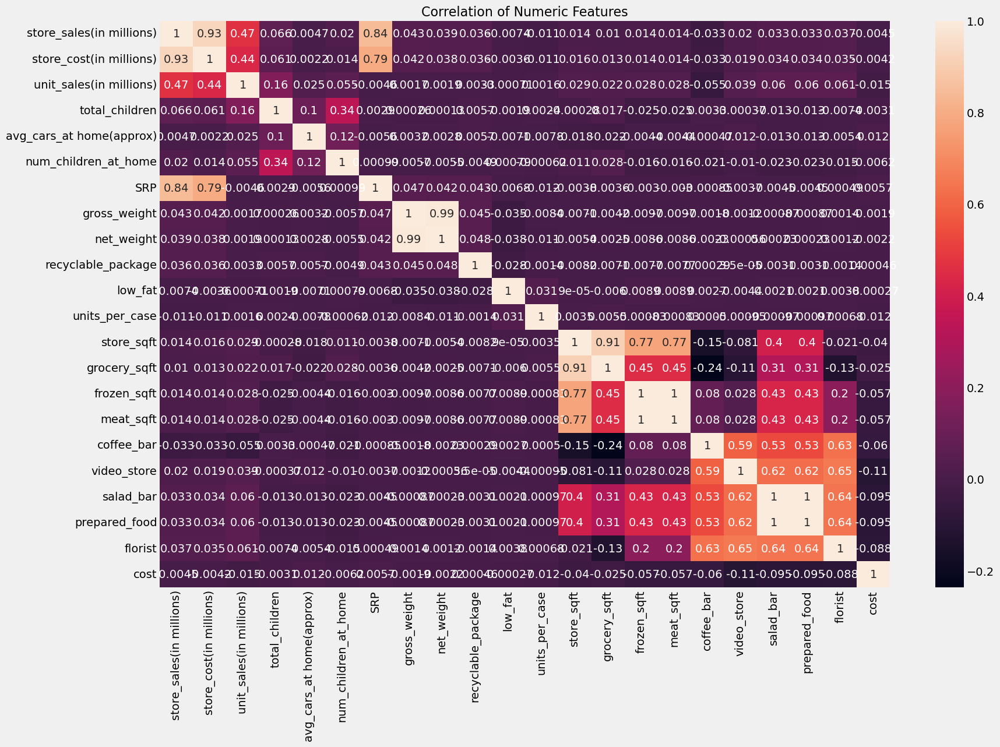

In [ ]:
plt.figure(figsize=(18, 12))
plt.title('Correlation of Numeric Features',y=1,size=16)
sns.heatmap(df.corr(),annot=True)
plt.show()

<h2><font color=#990000> Observations</font></h2>

#### I choose the thresholds with 0.8 and -0.8 so features that greater than 0.8 or lesser than -0.8 are considered as strong positive correlation and strong negative correlation respectively

As the charts shows, we can observe the following things 

- **"prepared_food"** and **"salad_bar"** have strong positive relationship (they have 1 for correlation point)
- **"meat_sqft"** and **"frozen_sqft"** have strong positive relationship (they have 1 for correlation point)
- **"net_weight"** and **"gross_weight"** have strong positive relationship (they have  0.99 for correlation point)
- **"store_sales"** and **"store_cost"** have strong positive relationship(they have 0.93 for correlation point)
- **"grocery_sqft"** and **"store_sqft"** have strong positive relationship(they have 0.91 for correlation point) 
- **"SRP"** has high correlation with **"store_sales"** and **"store_cost"** for 0.84 and 0.79 respectivvely

#### meat_sqft                    -0.048254
#### frozen_sqft                  -0.048262
#### ---------------------------------------------------
##### salad_bar                    -0.094774
##### prepared_food                -0.094774
#### ---------------------------------------------------
##### SRP                           0.005738
##### store_cost(in millions)       0.000141
##### store_sales(in millions)     -0.001083
#### ---------------------------------------------------
##### gross_weight                 -0.001853
##### net_weight                   -0.002197
#### ---------------------------------------------------
#### grocery_sqft                 -0.025498
#### store_sqft                   -0.040066




####   In conclusion, based on above analysis i chose to the remove following featues,
1. "salad_bar",
2. "meat_sqft",
3. "gross_weight", 
4. "store_sales", 
5. "store_cost", 
6. "store_sqft"

In [ ]:
df = df.drop(columns=['meat_sqft', 'salad_bar','gross_weight',
                          'store_sales(in millions)', 'store_cost(in millions)', 'store_sqft'])
df.head()

,unit_sales(in millions),promotion_name,sales_country,marital_status,gender,total_children,education,member_card,occupation,houseowner,...,store_city,store_state,grocery_sqft,frozen_sqft,coffee_bar,video_store,prepared_food,florist,media_type,cost
0,3,Double Down Sale,Canada,M,F,2,High School Degree,Bronze,Professional,Y,...,Vancouver,BC,16418,63.371918,1,1.0,1,1,Cash Register Handout,142.71
1,3,Shelf Clearing Days,USA,S,F,4,High School Degree,Bronze,Professional,Y,...,Seattle,WA,13305,68.891219,1,0.0,0,0,Radio,99.77
2,3,Two Day Sale,Mexico,S,F,2,Graduate Degree,Bronze,Professional,Y,...,Merida,Yucatan,20141,79.956238,1,1.0,1,1,Product Attachment,76.88
3,3,Cash Register Lottery,USA,S,F,2,Partial High School,Normal,Skilled Manual,Y,...,Salem,OR,18670,73.586684,1,1.0,1,1,"Daily Paper, Radio, TV",55.59
4,3,One Day Sale,Mexico,S,F,5,High School Degree,Bronze,Professional,Y,...,Hidalgo,Zacatecas,30351,69.419018,0,0.0,0,0,Street Handout,146.72


In [ ]:
df["media_type"].unique()

array(['Cash Register Handout', 'Radio', 'Product Attachment',
       'Daily Paper, Radio, TV', 'Street Handout', 'In-Store Coupon',
       'Daily Paper, Radio', 'Sunday Paper', 'Sunday Paper, Radio',
       'Daily Paper', 'Bulk Mail', 'Sunday Paper, Radio, TV', 'TV'],
      dtype=object)

<h2><font color=#990000> Observations</font></h2>

- As we can clearly see from the unique values of the media type column that some of the values are repeating and have mixed up data into a single vlaue. Like (TV, Radio, Daily Paper, Sunday Paper) multiple individual values have mixed up together to form a sinle value of media type.
- So we will be sargrigating all unique values and create a new column in the dataset

In [ ]:
temp=df["media_type"].value_counts()
media_types=temp.index.to_numpy()
new_media_types=[]
for m in media_types:
    x=m.split(",")
    for i in x:
        i.lstrip()
        print(i.lstrip())
        new_media_types.append(i.lstrip())

Daily Paper
Radio
Product Attachment
Daily Paper
Radio
TV
Daily Paper
Street Handout
Radio
Sunday Paper
In-Store Coupon
Sunday Paper
Radio
Cash Register Handout
TV
Bulk Mail
Sunday Paper
Radio
TV


In [ ]:
media_list=list(set(new_media_types))
df[media_list]=np.zeros(9,dtype = int)

for media in media_list:
    print(media)
    df[media]=df["media_type"].apply(lambda x: 1 if media in x else 0 )

Radio
Daily Paper
In-Store Coupon
Bulk Mail
Product Attachment
Sunday Paper
TV
Street Handout
Cash Register Handout


In [ ]:
df = df.drop(columns=['media_type'])
df.head()

,unit_sales(in millions),promotion_name,sales_country,marital_status,gender,total_children,education,member_card,occupation,houseowner,...,cost,Radio,Daily Paper,In-Store Coupon,Bulk Mail,Product Attachment,Sunday Paper,TV,Street Handout,Cash Register Handout
0,3,Double Down Sale,Canada,M,F,2,High School Degree,Bronze,Professional,Y,...,142.71,0,0,0,0,0,0,0,0,1
1,3,Shelf Clearing Days,USA,S,F,4,High School Degree,Bronze,Professional,Y,...,99.77,1,0,0,0,0,0,0,0,0
2,3,Two Day Sale,Mexico,S,F,2,Graduate Degree,Bronze,Professional,Y,...,76.88,0,0,0,0,1,0,0,0,0
3,3,Cash Register Lottery,USA,S,F,2,Partial High School,Normal,Skilled Manual,Y,...,55.59,1,1,0,0,0,0,1,0,0
4,3,One Day Sale,Mexico,S,F,5,High School Degree,Bronze,Professional,Y,...,146.72,0,0,0,0,0,0,0,1,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36256 entries, 0 to 36255
Data columns (total 37 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   unit_sales(in millions)   36256 non-null  int64  
 1   promotion_name            36256 non-null  object 
 2   sales_country             36256 non-null  object 
 3   marital_status            36256 non-null  object 
 4   gender                    36256 non-null  object 
 5   total_children            36256 non-null  int64  
 6   education                 36256 non-null  object 
 7   member_card               36256 non-null  object 
 8   occupation                36256 non-null  object 
 9   houseowner                36256 non-null  object 
 10  avg_cars_at home(approx)  36256 non-null  int64  
 11  avg. yearly_income        36256 non-null  object 
 12  num_children_at_home      36256 non-null  float64
 13  SRP                       36256 non-null  float64
 14  net_we

In [ ]:
df.shape

(36256, 37)

<h4 style="color: #66ccff"> Encoding the categorical data using Label Encoding </h4>

In [ ]:
def encodeCategorialValues(df):
    global col_names_values
    non_catagorial = list(df.select_dtypes(include=[np.object]))
    for columnName in non_catagorial:
        unique_val = len(df[columnName].unique())
        value = np.sort(df[columnName].unique())
        col_names_values[columnName] = list(value)
        lst = list(value)
        test_dict = dict()
        for i in value:
            test_dict[i] = lst.index(i)
        df[columnName] = df[columnName].map(test_dict)
    return df
col_names_values = dict()
encodeCategorialValues(df)
print(col_names_values)
df.sample(n=5)

{'promotion_name': ['Bag Stuffers', 'Best Savings', 'Big Promo', 'Big Time Discounts', 'Big Time Savings', 'Bye Bye Baby', 'Cash Register Lottery', 'Coupon Spectacular', 'Dimes Off', 'Dollar Cutters', 'Dollar Days', 'Double Down Sale', 'Double Your Savings', 'Fantastic Discounts', 'Free For All', 'Go For It', 'Green Light Days', 'Green Light Special', 'High Roller Savings', 'I Cant Believe It Sale', 'Money Savers', 'Mystery Sale', 'One Day Sale', 'Pick Your Savings', 'Price Cutters', 'Price Destroyers', 'Price Savers', 'Price Slashers', 'Price Smashers', 'Price Winners', 'Sale Winners', 'Sales Days', 'Sales Galore', 'Save-It Sale', 'Saving Days', 'Savings Galore', 'Shelf Clearing Days', 'Shelf Emptiers', 'Super Duper Savers', 'Super Savers', 'Super Wallet Savers', 'Three for One', 'Tip Top Savings', 'Two Day Sale', 'Two for One', 'Unbeatable Price Savers', 'Wallet Savers', 'Weekend Markdown', 'You Save Days'], 'sales_country': ['Canada', 'Mexico', 'USA'], 'marital_status': ['M', 'S'], 

,unit_sales(in millions),promotion_name,sales_country,marital_status,gender,total_children,education,member_card,occupation,houseowner,...,cost,Radio,Daily Paper,In-Store Coupon,Bulk Mail,Product Attachment,Sunday Paper,TV,Street Handout,Cash Register Handout
16619,3,32,2,0,0,4,0,1,1,1,...,142.45,0,0,0,1,0,0,0,0,0
35999,3,43,1,1,1,2,2,1,4,1,...,94.79,1,0,0,0,0,0,0,0,0
1661,3,43,1,1,1,2,4,2,4,1,...,97.34,1,1,0,0,0,0,1,0,0
20752,3,18,2,0,0,2,4,0,1,1,...,101.84,0,1,0,0,0,0,0,0,0
23034,1,32,2,1,0,5,0,3,3,0,...,109.03,1,1,0,0,0,0,0,0,0


### Data Preparation for model building:

In [ ]:
Y = df["cost"]
X = df.drop(columns='cost')

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.20,random_state=42)
print('Shape of training feature:', X_train.shape)
print('Shape of testing feature:', X_test.shape)
print('Shape of training label:', Y_train.shape)
print('Shape of testing label:', Y_test.shape)

Shape of training feature: (29004, 36)
Shape of testing feature: (7252, 36)
Shape of training label: (29004,)
Shape of testing label: (7252,)


In [ ]:
## Feature Scaling
sc = StandardScaler()
# fit_transform() method first trains the Scaler on dataset and then transforms it between 0 and 1
X_train = sc.fit_transform(X_train)
# transform() method only transforms the dataset based on what it has learnt on the dataset before
X_test = sc.transform(X_test)

<h2><font color=blue> K-Best Features</font></h2>

<h3 style="color: #66ccff">Method 1 (Feature importance from coefficients) </h3>

In [ ]:
df=df.drop(columns='cost')
df1=df.copy()

In [ ]:
df1.columns

Index(['unit_sales(in millions)', 'promotion_name', 'sales_country',
       'marital_status', 'gender', 'total_children', 'education',
       'member_card', 'occupation', 'houseowner', 'avg_cars_at home(approx)',
       'avg. yearly_income', 'num_children_at_home', 'SRP', 'net_weight',
       'recyclable_package', 'low_fat', 'units_per_case', 'store_type',
       'store_city', 'store_state', 'grocery_sqft', 'frozen_sqft',
       'coffee_bar', 'video_store', 'prepared_food', 'florist', 'Radio',
       'Daily Paper', 'In-Store Coupon', 'Bulk Mail', 'Product Attachment',
       'Sunday Paper', 'TV', 'Street Handout', 'Cash Register Handout'],
      dtype='object')

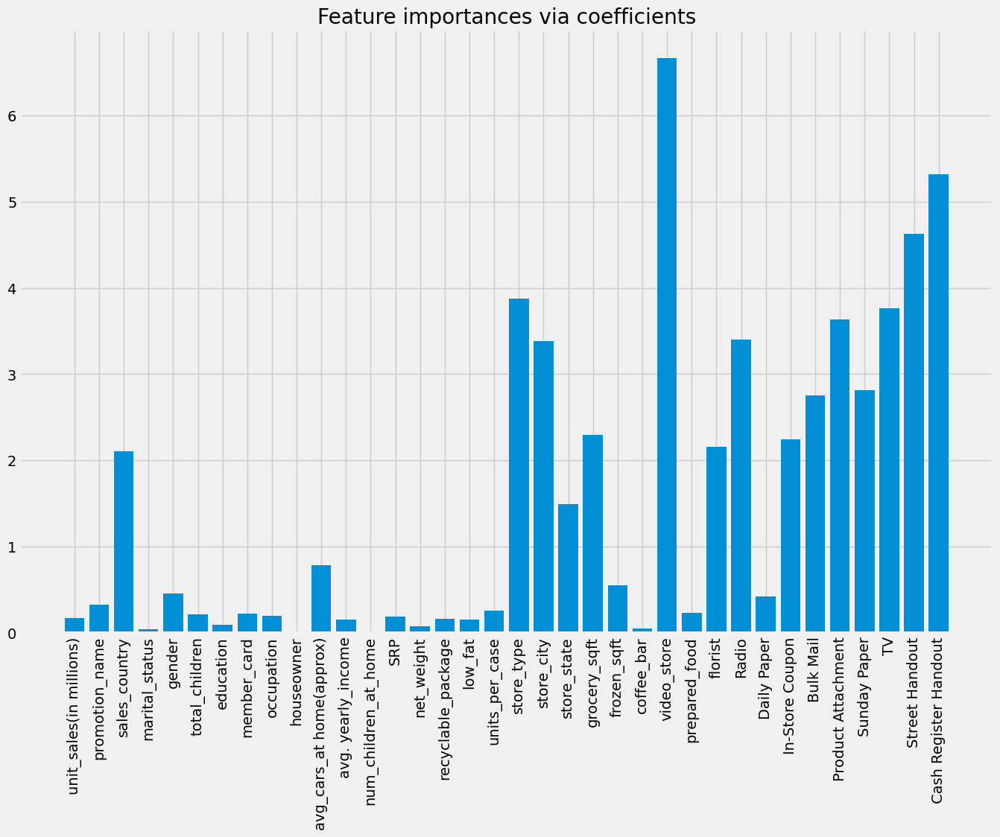

In [ ]:
linear_reg = LinearRegression().fit(X_train, Y_train)
importance = np.abs(linear_reg.coef_)
feature_names = np.array(df1.columns)
plt.figure(figsize=(15, 10))
plt.bar(height=importance, x=feature_names)
plt.title("Feature importances via coefficients")
plt.xticks(rotation = 90)
plt.show()

In [ ]:
threshold = np.sort(importance)[-10] + 0.01
sfm = SelectFromModel(linear_reg, threshold=threshold).fit(X_train, Y_train)
print(f"Features selected by SelectFromModel: {feature_names[sfm.get_support()]}")

Features selected by SelectFromModel: ['store_type' 'store_city' 'video_store' 'Radio' 'Product Attachment'
 'Sunday Paper' 'TV' 'Street Handout' 'Cash Register Handout']


<h3 style="color: #66ccff">Method 2 (Selecting features with Sequential Feature Selection) </h3>

In [ ]:
sfs_forward = SequentialFeatureSelector(linear_reg, n_features_to_select=9, direction="forward").fit(X_train, Y_train)
sfs_backward = SequentialFeatureSelector(linear_reg, n_features_to_select=9, direction="backward").fit(X_train, Y_train)

print("Features selected by forward sequential selection: "f"{feature_names[sfs_forward.get_support()]}")
print("Features selected by backward sequential selection: "f"{feature_names[sfs_backward.get_support()]}")

Features selected by forward sequential selection: ['sales_country' 'store_city' 'grocery_sqft' 'video_store' 'Radio'
 'Daily Paper' 'TV' 'Street Handout' 'Cash Register Handout']
Features selected by backward sequential selection: ['sales_country' 'store_city' 'grocery_sqft' 'video_store'
 'Product Attachment' 'Sunday Paper' 'TV' 'Street Handout'
 'Cash Register Handout']


<h3 style="color: #66ccff">Method 3 </h3>

Feature 0: 5.669305
Feature 1: 30.730673
Feature 2: 35.601106
Feature 3: 0.545219
Feature 4: 4.677527
Feature 5: 0.000918
Feature 6: 0.000000
Feature 7: 0.202504
Feature 8: 0.312681
Feature 9: 0.000818
Feature 10: 5.655886
Feature 11: 0.265962
Feature 12: 0.454269
Feature 13: 1.662047
Feature 14: 0.736414
Feature 15: 0.051609
Feature 16: 0.542556
Feature 17: 2.312677
Feature 18: 183.596551
Feature 19: 46.094596
Feature 20: 35.885139
Feature 21: 29.527567
Feature 22: 97.310903
Feature 23: 98.884262
Feature 24: 316.251412
Feature 25: 250.580715
Feature 26: 205.453916
Feature 27: 178.961374
Feature 28: 487.208681
Feature 29: 0.748573
Feature 30: 41.912211
Feature 31: 83.017959
Feature 32: 3.050981
Feature 33: 840.393324
Feature 34: 266.594280
Feature 35: 577.813999


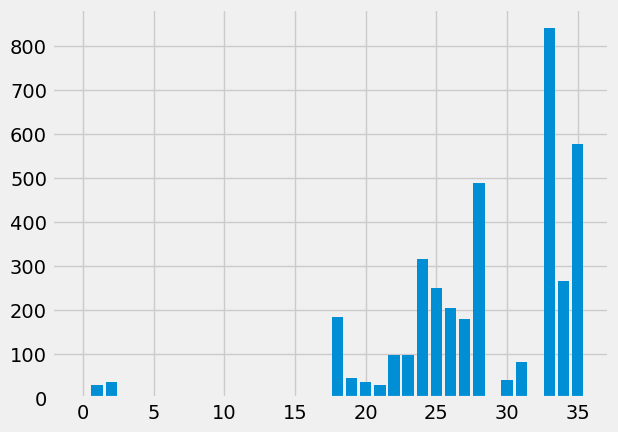

In [ ]:
def select_features(X_train, y_train, X_test):
	fs = SelectKBest(score_func=f_regression, k='all')
	fs.fit(X_train, y_train)
	X_train_fs = fs.transform(X_train)
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs

X, Y = make_regression(n_samples=1000, n_features=100, n_informative=10, noise=0.1, random_state=1)
X_train_fs, X_test_fs, fs = select_features(X_train, Y_train, X_test)
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
plt.bar([i for i in range(len(fs.scores_))], fs.scores_)
plt.show()

<h2><font color=#FF0000> Note</font></h2>

#### We will be using various evaluation techniques to evaluate the performance of our model
##### - Mean Squared Error (MSE)
##### - Root Mean Squared Error (RMSE)
##### - Mean Absolute Error (MAE)
#### - mean absolute percentage error

<h3><font color=blue> (1):-  Linear Regression (Base Model)</font></h3>

In [ ]:
lin_reg_model = LinearRegression()

lin_reg_model.fit(X_train, Y_train)

Y_pred_lr = lin_reg_model.predict(X_train)
Y_pred = lin_reg_model.predict(X_test)

print('Train R2 Score Of Linear Regression: ',lin_reg_model.score(X_train, Y_train))
print('Test R2 Score Linear Regression: ',lin_reg_model.score(X_test, Y_test))
print()
print( "Mean absolute Percentage Error Train:- ",mean_absolute_percentage_error(Y_train, Y_pred_lr))
print( "Mean absolute Percentage Error Test:- ",mean_absolute_percentage_error(Y_test, Y_pred))
print()
print('Train MSE',mean_squared_error(Y_train, Y_pred_lr))
print('Test MSE',mean_squared_error(Y_test, Y_pred))
print()
print('Train RMSE',np.sqrt(mean_absolute_error(Y_train, Y_pred_lr)))
print('Test RMSE',np.sqrt(mean_absolute_error(Y_test, Y_pred)))
print() 
print('Train MAE',mean_absolute_error(Y_train, Y_pred_lr))
print('Test MAE',mean_absolute_error(Y_test, Y_pred))

Train R2 Score Of Linear Regression:  0.0954127994241738
Test R2 Score Linear Regression:  0.09700030561843187

Mean absolute Percentage Error Train:-  0.28118597325082695
Mean absolute Percentage Error Test:-  0.28410133648341507

Train MSE 813.4760504669738
Test MSE 817.8603343304433

Train RMSE 4.903487741113724
Test RMSE 4.918606516643922

Train MAE 24.044192027252578
Test MAE 24.19269006557205


In [ ]:
lin_reg_model.coef_

array([ 0.16780456, -0.32201794, -2.10892587,  0.03585339, -0.45835718,
       -0.21149824,  0.095987  ,  0.22272803,  0.1998548 ,  0.00734659,
        0.78091654, -0.14835198, -0.00927601,  0.18657814, -0.07597161,
       -0.16323666, -0.1557623 , -0.25747791, -3.87881934, -3.38344139,
       -1.49236498, -2.29657361, -0.55203349,  0.05082157, -6.66500987,
        0.23346965, -2.15610624,  3.39766937, -0.42101487,  2.24114654,
        2.74933891,  3.63123375,  2.8099979 , -3.76618333,  4.62563643,
        5.31726674])

Text(0, 0.5, 'y_pred')

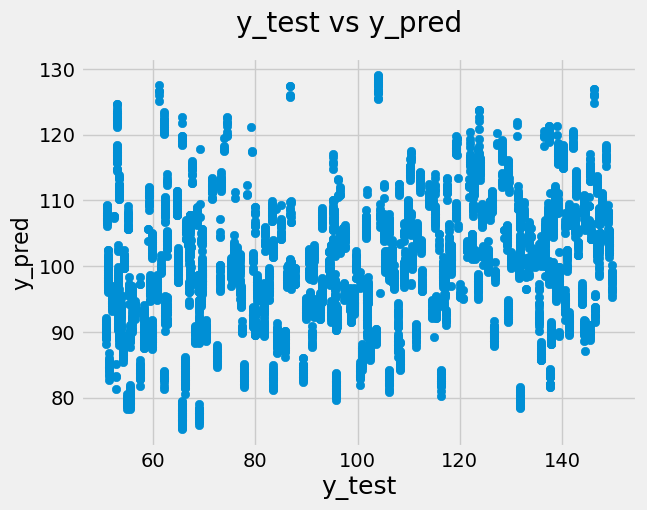

In [ ]:
# Plotting y_test and y_pred to understand the spread

fig = plt.figure()
plt.scatter(Y_test, Y_pred)
fig.suptitle('y_test vs y_pred', fontsize = 20)              # Plot heading 
plt.xlabel('y_test', fontsize = 18)                          # X-label
plt.ylabel('y_pred', fontsize = 16)  

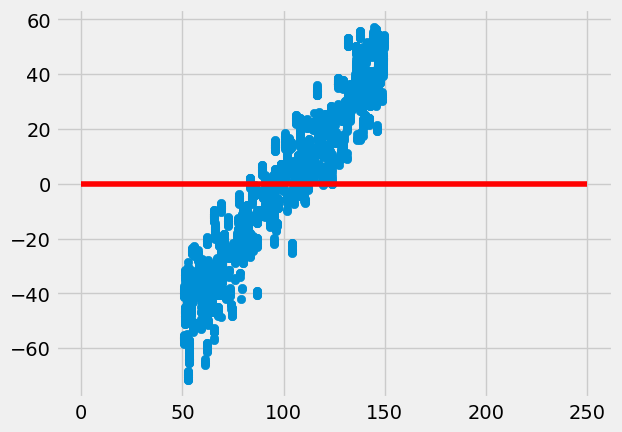

In [ ]:
def plot_reg(y_test,y_pred_test):
    resd=y_test-y_pred_test
    plt.scatter(x=y_test,y=resd)
    plt.plot([0,250],[0,0],color='r')

plot_reg(Y_test,Y_pred)

<h4 style="color: #66ccff"> Hyperparameter tuning of Linear Regression Model using GridSearchCV approach</h4>

In [ ]:
parameters = {'fit_intercept':[True,False], 'normalize':[True,False], 'copy_X':[True, False]}
grid = GridSearchCV(lin_reg_model,parameters, cv=5)
grid.fit(X_train, Y_train)

Y_pred_grid_lr = grid.predict(X_train)
Y_pred_grid = grid.predict(X_test)


print ("R2 Score Of Linear Regression: ", grid.best_score_)
print("MSE: %.2f" % np.mean((grid.predict(X_test) - Y_test) ** 2))

R2 Score Of Linear Regression:  0.09183104999360854
MSE: 817.86


<h3><font color=blue> (2):- Lasso regression</font></h3>

In [ ]:
lasso = Lasso(alpha=0.01)
lasso.fit(X_train, Y_train)

y_pred_lasso_train = lasso.predict(X_train)
y_pred_lasso = lasso.predict(X_test)

print('Train R2 Score Of Lasso regression: ',lasso.score(X_train, Y_train))
print('Test R2 Score Lasso regression: ',lasso.score(X_test, Y_test))
print() 
print( "Mean absolute Percentage Error Train:- ",mean_absolute_percentage_error(Y_train, y_pred_lasso_train))
print( "Mean absolute Percentage Error Test:- ",mean_absolute_percentage_error(Y_test, y_pred_lasso))
print()
print('Train MSE',mean_squared_error(Y_train, y_pred_lasso_train))
print('Test MSE',mean_squared_error(Y_test, y_pred_lasso))
print()
print('Train RMSE',np.sqrt(mean_absolute_error(Y_train, y_pred_lasso_train)))
print('Test RMSE',np.sqrt(mean_absolute_error(Y_test, y_pred_lasso)))
print() 
print('Train MAE',mean_absolute_error(Y_train, y_pred_lasso_train))
print('Test MAE',mean_absolute_error(Y_test, y_pred_lasso))

Train R2 Score Of Lasso regression:  0.09540020614281552
Test R2 Score Lasso regression:  0.09696626730251101

Mean absolute Percentage Error Train:-  0.28125515903654436
Mean absolute Percentage Error Test:-  0.284163452426051

Train MSE 813.4873753373404
Test MSE 817.8911633424709

Train RMSE 4.904131083897547
Test RMSE 4.919209115588135

Train MAE 24.050501688050133
Test MAE 24.198618322885398


<h4 style="color: #66ccff">  Hyperparameter tuning of Lasso Regression Model using GridSearchCV approach</h4>

In [ ]:
param_grid = { 'alpha': np.arange(0.00, 1.0, 0.01) }
lasso_hyper_model = GridSearchCV(estimator = lasso, param_grid = param_grid, cv = 5, n_jobs=-1)

lasso_hyper_model.fit(X_train, Y_train)
print("Best Score:\n", lasso_hyper_model.best_score_)
print("Best Hyper Parameters:\n", lasso_hyper_model.best_params_)

Best Score:
 0.09199532235271488
Best Hyper Parameters:
 {'alpha': 0.03}


<h3><font color=blue> (3):- Ridge regression</font></h3>


In [ ]:
rr = Ridge(alpha=0.01)
rr.fit(X_train, Y_train)

y_pred_rr_train = rr.predict(X_train)
y_pred_rr = rr.predict(X_test)

print('Train R2 Score Of Ridge regression: ',rr.score(X_train, Y_train))
print('Test R2 Score Ridge regression: ',rr.score(X_test, Y_test))
print()
print( "Mean absolute Percentage Error Train:- ",mean_absolute_percentage_error(Y_train, y_pred_rr_train))
print( "Mean absolute Percentage Error Test:- ",mean_absolute_percentage_error(Y_test, y_pred_rr))
print()
print('Train MSE',mean_squared_error(Y_train, y_pred_rr_train))
print('Test MSE',mean_squared_error(Y_test, y_pred_rr))
print()
print('Train RMSE',np.sqrt(mean_absolute_error(Y_train, y_pred_rr_train)))
print('Test RMSE',np.sqrt(mean_absolute_error(Y_test, y_pred_rr)))
print() 
print('Train MAE', mean_absolute_error(Y_train, y_pred_rr_train))
print('Test MAE', mean_absolute_error(Y_test, y_pred_rr))

Train R2 Score Of Ridge regression:  0.09541279942400138
Test R2 Score Ridge regression:  0.09700029855952941

Mean absolute Percentage Error Train:-  0.2811859836094803
Mean absolute Percentage Error Test:-  0.28410134680534177

Train MSE 813.4760504671287
Test MSE 817.8603407237969

Train RMSE 4.903487840029251
Test RMSE 4.918606618636711

Train MAE 24.04419299731473
Test MAE 24.192691068896863


<h4 style="color: #66ccff">  Hyperparameter tuning of Ridge Regression Model using GridSearchCV approach</h4>

In [ ]:
param_grid = { 'alpha': np.arange(0.00, 1.0, 0.01) }
Ridge_hyper_model = GridSearchCV(estimator = rr, param_grid = param_grid, cv = 5, n_jobs=-1)

Ridge_hyper_model.fit(X_train, Y_train)
print("Best Score:\n", Ridge_hyper_model.best_score_)
print("Best Hyper Parameters:\n", Ridge_hyper_model.best_params_)

Best Score:
 0.09183127128827909
Best Hyper Parameters:
 {'alpha': 0.99}


<h3><font color=blue> (4):- ElasticNet Regression</font></h3>

In [ ]:
enet = ElasticNet(alpha = 0.01)
enet.fit(X_train, Y_train)

y_pred_enet_train = enet.predict(X_train)
y_pred_enet = enet.predict(X_test)

print('Train R2 Score Of ElasticNet Regression: ',enet.score(X_train, Y_train))
print('Test R2 Score ElasticNet Regression: ',enet.score(X_test, Y_test))
print()
print( "Mean absolute Percentage Error Train:- ",mean_absolute_percentage_error(Y_train, y_pred_enet_train))
print( "Mean absolute Percentage Error Test:- ",mean_absolute_percentage_error(Y_test, y_pred_enet))
print()
print('Train MSE',mean_squared_error(Y_train, y_pred_enet_train))
print('Test MSE',mean_squared_error(Y_test, y_pred_enet))
print()
print('Train RMSE',np.sqrt(mean_absolute_error(Y_train, y_pred_enet_train)))
print('Test RMSE',np.sqrt(mean_absolute_error(Y_test, y_pred_enet)))
print() 
print('Train MAE',mean_absolute_error(Y_train, y_pred_enet_train))
print('Test MAE',mean_absolute_error(Y_test, y_pred_enet))

Train R2 Score Of ElasticNet Regression:  0.09536040869683682
Test R2 Score ElasticNet Regression:  0.09683070606641286

Mean absolute Percentage Error Train:-  0.28136756365941834
Mean absolute Percentage Error Test:-  0.2842848030031781

Train MSE 813.5231643349657
Test MSE 818.0139431823394

Train RMSE 4.905215694596693
Test RMSE 4.920411903489879

Train MAE 24.061141010517716
Test MAE 24.210453300004897


<h4 style="color: #66ccff">  Hyperparameter tuning of ElasticNet Regression using GridSearchCV approach</h4>

In [ ]:
param_grid = { 'alpha': np.arange(0.00, 1.0, 0.01) }
enet_hyper_model= GridSearchCV(enet, param_grid, cv=5, n_jobs= -1, verbose=1)

enet_hyper_model.fit(X_train, Y_train)
print("Best Score:\n", enet_hyper_model.best_score_)
print("Best Hyper Parameters:\n", enet_hyper_model.best_params_)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best Score:
 0.09185561301977876
Best Hyper Parameters:
 {'alpha': 0.01}


<h3><font color=blue> (5):-  Decision Tree Regressor</font></h3>

In [ ]:
dt = DecisionTreeRegressor(random_state=42)
dt.fit(X_train, Y_train)

y_pred_dt_train = dt.predict(X_train)
y_pred_dt = dt.predict(X_test)

print('Train R2  Score Of Decision Tree: ',dt.score(X_train, Y_train))
print('Test R2 Score Decision Tree: ',dt.score(X_test, Y_test))
print()
print( "Mean absolute Percentage Error Train:- ",mean_absolute_percentage_error(Y_train, y_pred_dt_train))
print( "Mean absolute Percentage Error Test:- ",mean_absolute_percentage_error(Y_test, y_pred_dt))
print()
print('Train MSE',mean_squared_error(Y_train, y_pred_dt_train))
print('Test MSE',mean_squared_error(Y_test, y_pred_dt))
print()
print('Train RMSE',np.sqrt(mean_absolute_error(Y_train, y_pred_dt_train)))
print('Test RMSE',np.sqrt(mean_absolute_error(Y_test, y_pred_dt)))
print() 
print('Train MAE',mean_absolute_error(Y_train, y_pred_dt_train))
print('Test MAE',mean_absolute_error(Y_test, y_pred_dt))

Train R2  Score Of Decision Tree:  1.0
Test R2 Score Decision Tree:  0.9986344249756811

Mean absolute Percentage Error Train:-  1.499044258561166e-15
Mean absolute Percentage Error Test:-  0.00027046668423619344

Train MSE 3.909419445392454e-26
Test MSE 1.236821731936018

Train RMSE 3.7921085892540637e-07
Test RMSE 0.19088437601965796

Train MAE 1.4380087552694445e-13
Test MAE 0.03643684500841417


<h4 style="color: #66ccff">  Hyperparameter tuning of DecisionTreeClassifier Model using GridSearchCV approach</h4>

In [ ]:
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
}
dt_hyper_model = GridSearchCV(estimator=dt, param_grid=params, cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")
dt_hyper_model.fit(X_train, Y_train)
print("Best Hyper Parameters:\n", dt_hyper_model.best_params_)

Fitting 4 folds for each of 25 candidates, totalling 100 fits
Best Hyper Parameters:
 {'max_depth': 2, 'min_samples_leaf': 5}


<h3><font color=blue> (6):- Random Forest Regressor</font></h3>

In [ ]:
forest = RandomForestRegressor(random_state=42)
forest.fit(X_train, Y_train)

y_pred_forest_train = forest.predict(X_train)
y_pred_forest = forest.predict(X_test)

print('Train R2 Score Of  Random Forest: ',forest.score(X_train, Y_train))
print('Test R2 Score  Random Forest: ',forest.score(X_test, Y_test))
print()
print( "Mean absolute Percentage Error Train:- ",mean_absolute_percentage_error(Y_train, y_pred_forest_train))
print( "Mean absolute Percentage Error Test:- ",mean_absolute_percentage_error(Y_test, y_pred_forest))
print()
print('Train MSE',mean_squared_error(Y_train, y_pred_forest_train))
print('Test MSE',mean_squared_error(Y_test, y_pred_forest))
print()
print('Train RMSE',np.sqrt(mean_absolute_error(Y_train, y_pred_forest_train)))
print('Test RMSE',np.sqrt(mean_absolute_error(Y_test, y_pred_forest)))
print() 
print('Train MAE',mean_absolute_error(Y_train, y_pred_forest_train))
print('Test MAE',mean_absolute_error(Y_test, y_pred_forest))

Train R2 Score Of  Random Forest:  0.9998232139847923
Test R2 Score  Random Forest:  0.998913645321768

Mean absolute Percentage Error Train:-  0.00026078437722511786
Mean absolute Percentage Error Test:-  0.0006345456367701084

Train MSE 0.15897990745104537
Test MSE 0.9839276866519568

Train RMSE 0.17396389302931578
Test RMSE 0.28007578164489827

Train MAE 0.030263436077915228
Test MAE 0.07844244346400073


<h4 style="color: #66ccff">  Hyperparameter tuning of RandomForestClassifier Model using GridSearchCV approach</h4>

In [ ]:
param_rf = { "bootstrap": [True, False], "max_depth": (3, 17), "n_estimators": (10, 30)}
rf_hyper_model= GridSearchCV(forest, param_rf, cv=5, n_jobs= -1, verbose=1)
rf_hyper_model.fit(X_train, Y_train)

print("Best Score:\n", rf_hyper_model.best_score_)
print("Best Hyper Parameters:\n", rf_hyper_model.best_params_)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best Score:
 0.9971852037905068
Best Hyper Parameters:
 {'bootstrap': True, 'max_depth': 17, 'n_estimators': 30}


<h3><font color=blue> (7):- XGBoost Regression</font></h3>

In [ ]:
xgb = xg.XGBRegressor(objective ='reg:squarederror', n_estimators = 20, seed = 123)
xgb.fit(X_train, Y_train)

y_pred_xgb_train = xgb.predict(X_train)
y_pred_xgb = xgb.predict(X_test)

print('Train R2 Score Of XGBoost: ',xgb.score(X_train, Y_train))
print('Test R2 Score XGBoost: ',xgb.score(X_test, Y_test))
print()
print( "Mean absolute Percentage Error Train:- ",mean_absolute_percentage_error(Y_train, y_pred_xgb_train))
print( "Mean absolute Percentage Error Test:- ",mean_absolute_percentage_error(Y_test, y_pred_xgb))
print()
print('Train MSE',mean_squared_error(Y_train, y_pred_xgb_train))
print('Test MSE',mean_squared_error(Y_test, y_pred_xgb))
print()
print('Train RMSE',np.sqrt(mean_absolute_error(Y_train, y_pred_xgb_train)))
print('Test RMSE',np.sqrt(mean_absolute_error(Y_test, y_pred_xgb)))
print() 
print('Train MAE',mean_absolute_error(Y_train, y_pred_xgb_train))
print('Test MAE',mean_absolute_error(Y_test, y_pred_xgb))

Train R2 Score Of XGBoost:  0.9123619464929935
Test R2 Score XGBoost:  0.9077826959267506

Mean absolute Percentage Error Train:-  0.07530289426638298
Mean absolute Percentage Error Test:-  0.07757614479500531

Train MSE 78.81103954611724
Test MSE 83.52259210015889

Train RMSE 2.563757923289807
Test RMSE 2.5982778390760095

Train MAE 6.572854689231265
Test MAE 6.751047729033497


<h4 style="color: #66ccff">  Hyperparameter tuning of XGBoost Regression Model using GridSearchCV approach</h4>

In [ ]:
params = { 'max_depth': [3,6,10],
           'n_estimators': [100, 500, 1000]}

clf = GridSearchCV(estimator=xgb, 
                   param_grid=params,
                   scoring='neg_mean_squared_error', 
                   verbose=1)
clf.fit(X_train, Y_train)
print("Best parameters:", clf.best_params_)
print("Best Hyper Parameters:\n", clf.best_params_)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best parameters: {'max_depth': 10, 'n_estimators': 500}
Best Hyper Parameters:
 {'max_depth': 10, 'n_estimators': 500}


<h3><font color=blue> (8):- KNN (K-Nearest Neighbor)</font></h3>

In [ ]:
knn = neighbors.KNeighborsRegressor(n_neighbors = 36)
knn.fit(X_train,Y_train)

y_pred_knn_train = knn.predict(X_train)
y_pred_knn = knn.predict(X_test)

print('Train R2 Score Of KNN: ',knn.score(X_train, Y_train))
print('Test R2 Score KNN: ',knn.score(X_test, Y_test))
print()
print( "Mean absolute Percentage Error Train:- ",mean_absolute_percentage_error(Y_train, y_pred_knn_train))
print( "Mean absolute Percentage Error Test:- ",mean_absolute_percentage_error(Y_test, y_pred_knn))
print()
print('Train MSE',mean_squared_error(Y_train, y_pred_knn_train))
print('Test MSE',mean_squared_error(Y_test, y_pred_knn))
print()
print('Train RMSE',np.sqrt(mean_absolute_error(Y_train, y_pred_knn_train)))
print('Test RMSE',np.sqrt(mean_absolute_error(Y_test, y_pred_knn)))
print() 
print('Train MAE',mean_absolute_error(Y_train, y_pred_knn_train))
print('Test MAE',mean_absolute_error(Y_test, y_pred_knn))

Train R2 Score Of KNN:  0.5222040198332472
Test R2 Score KNN:  0.49166984813177905

Mean absolute Percentage Error Train:-  0.18567996312921847
Mean absolute Percentage Error Test:-  0.19493527822602488

Train MSE 429.6717736307018
Test MSE 460.4022244347664

Train RMSE 4.007047567103389
Test RMSE 4.083704154847434

Train MAE 16.05643020502919
Test MAE 16.676639624318195


<h4 style="color: #66ccff">  Selecting K-value for knn model</h4> 

In [ ]:
rmse_val = [] #to store rmse values for different k
for K in range(20):
    K = K+1
    model = neighbors.KNeighborsRegressor(n_neighbors = K)

    model.fit(X_train, Y_train)  #fit the model
    pred=model.predict(X_test) #make prediction on test set
    error = np.sqrt(mean_squared_error(Y_test,pred)) #calculate rmse
    rmse_val.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  1 is: 21.459140778679462
RMSE value for k=  2 is: 19.196711242149753
RMSE value for k=  3 is: 18.615401481658775
RMSE value for k=  4 is: 18.459075401161943
RMSE value for k=  5 is: 18.420889680872076
RMSE value for k=  6 is: 18.476439890743723
RMSE value for k=  7 is: 18.626281877879222
RMSE value for k=  8 is: 18.704220033955107
RMSE value for k=  9 is: 18.802877822049517
RMSE value for k=  10 is: 19.07098393229958
RMSE value for k=  11 is: 19.27070151034589
RMSE value for k=  12 is: 19.41153986405419
RMSE value for k=  13 is: 19.579346555317915
RMSE value for k=  14 is: 19.681529415506834
RMSE value for k=  15 is: 19.78954361826392
RMSE value for k=  16 is: 19.86986553317892
RMSE value for k=  17 is: 20.005283885685504
RMSE value for k=  18 is: 20.12243882082697
RMSE value for k=  19 is: 20.247433624671814
RMSE value for k=  20 is: 20.344383838416526


<AxesSubplot:>

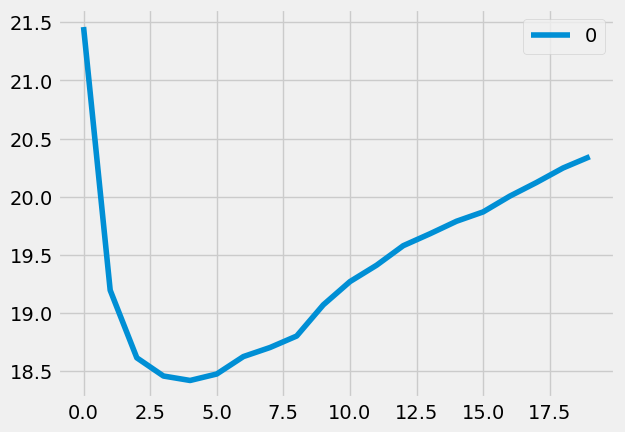

In [ ]:
curve = pd.DataFrame(rmse_val) #elbow curve 
curve.plot()

<h2><font color=#FF0000> Note</font></h2>

- The RMSE value decreases as we increase the k value. At k= 5, the RMSE is approximately 18.42, and shoots up on further increasing the k value. We can safely say that k=5 will give us the best result in this case.

In [ ]:
knn_final = neighbors.KNeighborsRegressor(n_neighbors = 5)
knn_final.fit(X_train,Y_train)

y_pred_knn_final_train = knn_final.predict(X_train)
y_pred_knn_final = knn_final.predict(X_test)

print('Train R2 Score Of KNN: ',knn_final.score(X_train, Y_train))
print('Test R2 Score KNN: ',knn_final.score(X_test, Y_test))
print()
print( "Mean absolute Percentage Error Train:- ",mean_absolute_percentage_error(Y_train, y_pred_knn_final_train))
print( "Mean absolute Percentage Error Test:- ",mean_absolute_percentage_error(Y_test, y_pred_knn_final))
print()
print('Train MSE',mean_squared_error(Y_train, y_pred_knn_final_train))
print('Test MSE',mean_squared_error(Y_test, y_pred_knn_final))
print()
print('Train RMSE',np.sqrt(mean_absolute_error(Y_train, y_pred_knn_final_train)))
print('Test RMSE',np.sqrt(mean_absolute_error(Y_test, y_pred_knn_final)))
print() 
print('Train MAE',mean_absolute_error(Y_train, y_pred_knn_final_train))
print('Test MAE',mean_absolute_error(Y_test, y_pred_knn_final))

Train R2 Score Of KNN:  0.7605117358911263
Test R2 Score KNN:  0.625346614899867

Mean absolute Percentage Error Train:-  0.10121800460232562
Mean absolute Percentage Error Test:-  0.13653465627188296

Train MSE 215.36670770541997
Test MSE 339.3291766348593

Train RMSE 2.959575153921841
Test RMSE 3.4144015020511347

Train MAE 8.759085091711489
Test MAE 11.658137617209045


<h3 style="color: blue"> STEP: 7 Design, develop and train the Pipeline </h3>

In [ ]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from sklearn.pipeline import Pipeline, make_pipeline

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from scipy.stats import chi2_contingency

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
from sklearn.feature_selection import SelectKBest,chi2

In [ ]:
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV,RandomizedSearchCV
from sklearn.feature_selection import f_regression,SelectFromModel,SequentialFeatureSelector,SelectKBest

In [ ]:
from sklearn import set_config
set_config(display='diagram')

In [ ]:
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error,mean_absolute_percentage_error

In [ ]:
### RUN FROM HERE 

In [ ]:
df_pipe = pd.read_csv('Train.csv')
#df_pipe_test = pd.read_csv('Test.csv')

In [ ]:
df_pipe.shape

(36256, 41)

In [ ]:
# df_pipe_train.drop(columns= ['row_id','avg_cars_at home(approx).1','meat_sqft', 'salad_bar','gross_weight',
#                       'store_sales(in millions)', 'store_cost(in millions)', 'store_sqft',
#                       'food_category', 'food_department', 'food_family', 'brand_name']).head()

In [ ]:
df_pipe_test = df_pipe.sample(frac=0.2)

<h4><font color=#FF0000> Filtered sample from train data as test data is already processed. Typically when our code run to prodcution, data is not processed.</font></h4>

In [ ]:
 #df_pipe_test = df_pipe_test.drop(columns=['row_id'])

In [ ]:
df_pipe_train = df_pipe.loc[df_pipe.index.difference(df_pipe_test.index)] #.drop(columns=['row_id'])

In [ ]:
df_pipe_train.head()

,row_id,food_category,food_department,food_family,store_sales(in millions),store_cost(in millions),unit_sales(in millions),promotion_name,sales_country,marital_status,...,grocery_sqft,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,media_type,cost
0,1,Bathroom Products,Health and Hygiene,Non-Consumable,4.35,1.3485,3,Double Down Sale,Canada,M,...,16418,4016,2678,1,1,1,1,1,Cash Register Handout,142.71
1,2,Fruit,Produce,Food,5.58,1.8414,3,Shelf Clearing Days,USA,S,...,13305,4746,3164,1,0,0,0,0,Radio,99.77
2,3,Beer and Wine,Alcoholic Beverages,Drink,5.10,2.1420,3,Two Day Sale,Mexico,S,...,20141,6393,4262,1,1,1,1,1,Product Attachment,76.88
3,4,Fruit,Canned Products,Food,4.20,2.0580,3,Cash Register Lottery,USA,S,...,18670,5415,3610,1,1,1,1,1,"Daily Paper, Radio, TV",55.59
5,6,Snack Foods,Snack Foods,Food,6.36,2.7348,4,Shelf Clearing Days,USA,S,...,24390,9184,6122,0,0,1,1,0,In-Store Coupon,109.21


In [ ]:
Y = df_pipe_train['cost']
X = df_pipe_train.drop(columns=['cost'])

In [ ]:
Y = pd.DataFrame(Y)

In [ ]:
X.reset_index(drop=True, inplace=True)
Y.reset_index(drop=True, inplace=True)

In [ ]:
Y_test_act = df_pipe_test['cost']
df_pipe_test.drop(columns=['cost'], inplace=True)

In [ ]:
Y_test_act.reset_index(drop=True, inplace=True)
df_pipe_test.reset_index(drop=True, inplace=True)

<h4><font color=#FF0000> Made custom functions to used inside the pipeline transformers, it is based on the function used earlier for analysis.</font></h4>

In [ ]:
def process_outlier(df):
    col_names = ['store_sales(in millions)','store_cost(in millions)']
    for col_name in col_names:
        q1= df[col_name].quantile(0.25)
        q3= df[col_name].quantile(0.75)
        iqr= q3-q1
        Lower_tail=q1-1.5*iqr
        Upper_tail=q3+1.5*iqr
        for i in range(0,len(df[col_name])):
            if df[col_name][i] > Upper_tail or df[col_name][i] < Lower_tail:
                df[col_name] = df[col_name].replace(df[col_name][i],np.median(df[col_name]))
    
    return df

<h4><font color=#FF0000> No need to run chi-square test, as it was already done in the analysis. Based on the result, we can drop features directly </font></h4>

In [ ]:
# def backward_filtering(df):
#     drop_col_names = []
#     col_name = []
#     p_values_col = {}
#     catagorial = list(df.select_dtypes(include=[np.object]))
#     for columnName in catagorial:
#         data= pd.crosstab(df[columnName], df['cost'])
#         p= chi2_contingency(data)[1]
#         threshold = 0.05
#         p_values_col[columnName]=p
#         if p > threshold:
#             df = df.drop(columns = columnName)
#             drop_col_names.append(columnName)
#         else:
#             col_name.append(columnName)
            
#     return df

<h4><font color=#FF0000> If test data is different than than we can define custom transformer. Buit here we have sample out data from training data, steps to pre-process data is same. Hence not using custom transformer. </font></h4>

In [ ]:
#class CustomTransformer(BaseEstimator, TransformerMixin) 

In [ ]:
def drop_columns(df):
    df.drop(columns= ['row_id','avg_cars_at home(approx).1','meat_sqft', 'salad_bar','gross_weight',
                      'store_sales(in millions)', 'store_cost(in millions)', 'store_sqft',
                      'food_category', 'food_department', 'food_family', 'brand_name'], inplace=True)
    return df

In [ ]:
def process_outliers_continuous(df):
    continuous_features = df.select_dtypes(include=[np.int64,np.float64])
    No_outliers_col = []
    delete_col = []
    
    for col_name in continuous_features:
        skew_val = df[[col_name]].skew().values[0] 
        if skew_val > 1 and col_name != 'num_children_at_home':
            df[col_name]= np.log10(df[col_name])
        elif skew_val > 0.5 and col_name != 'Total Accounts':
            df[col_name]= np.sqrt(df[col_name])
    
    return df

In [ ]:
def encodeCategorialValues(df):
    col_names_values = dict()
    non_catagorial = list(df.select_dtypes(include=[np.object]))
    for columnName in non_catagorial:
        unique_val = len(df[columnName].unique())
        value = np.sort(df[columnName].unique())
        col_names_values[columnName] = list(value)
        lst = list(value)
        test_dict = dict()
        for i in value:
            test_dict[i] = lst.index(i)
        df[columnName] = df[columnName].map(test_dict)
    return df

<h4><font color=#FF0000> Creating activities to put in the pipeline </font></h4>

In [ ]:
trf1 = FunctionTransformer(process_outlier)
trf2 = FunctionTransformer(drop_columns)
trf3 = FunctionTransformer(encodeCategorialValues)
trf4 = SelectKBest(score_func=f_regression,k=8)
trf5 = RandomForestRegressor()

<h4><font color=#FF0000> Creating pipeline using the activities.</font></h4>

In [ ]:
pipe = Pipeline([('process_outlier', trf1),
                ('drop_columns', trf2),
                ('encode_categorical_vals', trf3),
                ('feature_selection', trf4),
                ('train', trf5)]
                )


In [ ]:
# pipe.named_steps['feature_selection'].get_support(indices=False)

In [ ]:
pipe.fit(X,Y)

Pipeline(steps=[('process_outlier',
                 FunctionTransformer(func=<function process_outlier at 0x0000012B97E1BD30>)),
                ('drop_columns',
                 FunctionTransformer(func=<function drop_columns at 0x0000012B97E1B940>)),
                ('encode_categorical_vals',
                 FunctionTransformer(func=<function encodeCategorialValues at 0x0000012B9FD99F70>)),
                ('feature_selection',
                 SelectKBest(k=8,
                             score_func=<function f_regression at 0x0000012B997CD1F0>)),
                ('train', RandomForestRegressor())])

In [ ]:
pipe.named_steps['feature_selection']

SelectKBest(k=8, score_func=<function f_regression at 0x0000012B997CD1F0>)

In [ ]:
np.sqrt(mean_absolute_error(Y_test_act, pipe.predict(df_pipe_test)))

3.85587126644776

In [ ]:
# np.sqrt(mean_absolute_error(Y_test_act, Y_pred))

<h4><font color=#FF0000> Saving pipeline for deployment to production </font></h4>

In [ ]:
import pickle

In [ ]:
pickle.dump(pipe, open('cost_prediction_pipe_2.pkl', 'wb'))

<h4 style="color: blue">STEP 8</h4>

<h4 style="color: #66ccff">Linear Regression Base Model</h4>

Train R2 Score Of Linear Regression:  0.0954127994241738
Test R2 Score Linear Regression:  0.09700030561843187

<h4 style="color: #66ccff">Random Forest Base Model</h4>

Train R2 Score Of  Random Forest:  0.9998232139847923
Test R2 Score  Random Forest:  0.998913645321768


<h4 style="color: #66ccff">Random Forest Model score after hyperparameter tuning</h4>

Best R2 score: .9971852037905068
Best Hyper Parameters: 'bootstrap': True, 'max_depth': 17, 'n_estimators': 30}

<h4 style="color: #990000"> Based on the conducted study, key findings are: <br \> 1. There is considerable improvement in the r2 score from the base regression model when random forest model is used. <br \> 2. Best performance w.r.t r-square score is obtained using random forest model. <br \ >3. There is no considerable impact on performance after Hyperparameter tuning in the random forest model</h4>


<h4 style="color: #990000"> FUTURE IMPROVEMENTS <br \> 
1. As a next steps, we can explore more features which can potentially impact the media cost. <br \> 
2. Further we can try applying PCA(principle component analysis) to reduce multicollinearity. <br \> 
3. Also, we can explore state of art deep neural network to capture variations in the data. <br \></h4>

<h2 style="color: #ff6600"><center>Thank you :-) </center></h2>